<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Project 4: Predict West Nile Virus Presence in Mosquitos across the City of Chicago<br>
# Part 1: Data Cleaning and Exploratory Data Analysis

This workbook is 1 out of 4 parts of a prediction model to determine the occurrence of West Nile Virus. The focus of this part is to perform data cleaning and exploratory data analysis on the four datasets provided on Kaggle.

### Contents:
- [Background Information](#Background-Information)
- [Data Cleaning and EDA](#Data-Cleaning-and-EDA)
    - [Train and Test Datasets](#Train-and-Test-Datasets)
    - [Weather Dataset](#Weather-Dataset)
    - [Spray Dataset](#Spray-Dataset)
- [Exports](#Exports)

# Background Information

##### Kaggle competition link
The full competition can be found in the link below, and we are using the dataset contained there for our data science project.
https://www.kaggle.com/competitions/predict-west-nile-virus/overview

#### What is West Nile Virus?
West Nile virus (WNV) is the leading cause of mosquito-borne disease in the continental United States. There are currently no vaccines to prevent or medications to treat WNV in people. Fortunately, most people infected with WNV do not feel sick. 

#### Who are we?
As data scientists working at Disease And Treatment Agency, division of Societal Cures In Epidemiology and New Creative Engineering (DATA-SCIENCE), due to the recent epidemic of WNV in the Windy City, we've had the Department of Public Health set up a surveillance and control system. Our task is to predict occurences of the WNV using the dataset provided by the Chicago Department of Public Health (CDPH), and to evaluate the cost and benefit of spraying.

#### Why is it important?
Around 20% of people who become infected with WNV develop symptoms ranging from a persistent fever, to serious neurological illnesses that can result in death. Around 1 to 5% of infected people end up dying. As this is not a small number, the problem warrants attention from the authorities. 

#### West Nile Virus Facts

1) Contrary to popular belief, the West Nile Virus doesn't hop between humans, and is only transmited when specific mosquito species bite an infected bird and then a human. The most common vectors of WNV are crows and jays. As such, humans are a dead end host. [*source*](https://www.hopkinsmedicine.org/health/conditions-and-diseases/west-nile-virus)

2) The period of greatest concern is around summer through fall. Specifically June to November where WNV can spread rampantly.[*source*](https://www.cdc.gov/westnile/index.html#:~:text=West%20Nile%20virus%20(WNV)%20is,summer%20and%20continues%20through%20fall).

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

#requirement for Weather Dataset EDA
from sklearn.feature_extraction.text import CountVectorizer

#requirement for Spray Dataset EDA
from sklearn.neighbors import KernelDensity


In [2]:
# Read all csv files
train_df = pd.read_csv('../datasets/train.csv')
weather_df = pd.read_csv('../datasets/weather.csv')
spray_df = pd.read_csv('../datasets/spray.csv')
test_df = pd.read_csv('../datasets/test.csv')

In [3]:
pd.set_option('display.max_columns', None)

# Data Cleaning and EDA

## Train and Test Datasets

### Data Dictionary for the Train and Test Datasets

For the Train dataset, we are provided with a total of 10,506 observations from years 2007, 2009, 2011, and 2013. We are required to predict the 116,293 observations from years 2008, 2010, 2012, and 2014 in the test dataset. Observations start around May till early October for each year.

Zero number of mosquito observations in Train dataset has been removed as records exist only when a particular species of mosquitos is found at a certain trap at a certain time.


|Feature|Dataset|Description|
|---|---|---|
|Id|test_df|ID of the recorded observation|
|Date|train_df & test_df|Date that the WNV test is performed| 
|Address|train_df & test_df|Approximate address of the location of trap. Sent to Geocoder to obtain Long/Lat data| 
|Species|train_df & test_df|Species of mosquitos observed|
|Block|train_df & test_df|Block number of address|
|Street|train_df & test_df|Street name of the address|
|Trap|train_df & test_df|ID of the trap|
|AddressNumberAndStreet|train_df & test_df|Approximate address returned from GeoCoder|
|Latitude|train_df & test_df|Latitude returned from GeoCoder|
|Longitude|train_df & test_df|Longitude returned from GeoCoder|
|AddressAccuracy|train_df & test_df|Accuracy returned from GeoCoder|
|NumMosquitos|train_df|Number of mosquitoes caught in this trap. If more than 50 observed, observation of remaining mosquitos is split into another row|
|WnvPresent|train_df|Whether West Nile Virus was present in these mosquitos. 1 means WNV is present, and 0 means not present|

### Treatment of Train Dataset

In [4]:
train_df.shape

(10506, 12)

In [5]:
train_df.head()

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0
2,2007-05-29,"6200 North Mandell Avenue, Chicago, IL 60646, USA",CULEX RESTUANS,62,N MANDELL AVE,T007,"6200 N MANDELL AVE, Chicago, IL",41.994991,-87.769279,9,1,0
3,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX PIPIENS/RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,1,0
4,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,4,0


In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10506 entries, 0 to 10505
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Date                    10506 non-null  object 
 1   Address                 10506 non-null  object 
 2   Species                 10506 non-null  object 
 3   Block                   10506 non-null  int64  
 4   Street                  10506 non-null  object 
 5   Trap                    10506 non-null  object 
 6   AddressNumberAndStreet  10506 non-null  object 
 7   Latitude                10506 non-null  float64
 8   Longitude               10506 non-null  float64
 9   AddressAccuracy         10506 non-null  int64  
 10  NumMosquitos            10506 non-null  int64  
 11  WnvPresent              10506 non-null  int64  
dtypes: float64(2), int64(4), object(6)
memory usage: 985.1+ KB


Only `'Date` is not in the correct data type. Thus, we will change the values to DateTime.

In [7]:
train_df['Date']=pd.to_datetime(train_df['Date'])

#### Splitting the `'Date'` column to `'Year'`, `'Month'`, and `'Day'`

In [8]:
# Add new columns for day, month and year - weekday
# day
train_df['Day'] = train_df['Date'].dt.day
# month
train_df['Month'] = train_df['Date'].dt.month
# year
train_df['Year'] = train_df['Date'].dt.year

#### Exploration of Null Values

In [9]:
train_df.isnull().sum()

Date                      0
Address                   0
Species                   0
Block                     0
Street                    0
Trap                      0
AddressNumberAndStreet    0
Latitude                  0
Longitude                 0
AddressAccuracy           0
NumMosquitos              0
WnvPresent                0
Day                       0
Month                     0
Year                      0
dtype: int64

We noted there were no values that were null, and therefore all datapoints are complete, requiring no additional cleaning specifically for null values.

#### Treatment of Duplicated Rows

Through checking of the dataset, we found 106 duplicated rows with ``'NumMosquitos'`` less than 50. We proceeded to drop the duplicates as they represent ~1% of our dataset.

In [10]:
#Extracting the duplicated rows
train_dupl = train_df[train_df.duplicated(keep='first')]

#Masking for only those that has 'NumMosquitos' less than 50
train_dupl_less = train_dupl[train_dupl['NumMosquitos'] < 50]

#Dropping the duplicated rows by row index
train_df.drop(list(train_dupl_less.index), axis = 0, inplace=True)

#Resetting index
train_df.reset_index(inplace=True, drop = True)

#### Creating New Dataframes for 2011/2013 for Spray Data Exploration

In [11]:
train_2011 = train_df[train_df['Year']==2011]
train_2011_wnv = train_df[(train_df['WnvPresent']== 1) & (train_df['Year']==2011)]
train_2013 = train_df[train_df['Year']==2013]
train_2013_wnv = train_df[(train_df['WnvPresent']== 1) & (train_df['Year']==2013)]

### Treatment of Test dataset

In [12]:
test_df.shape

(116293, 11)

Number of observations for train dataset is significantly lower than test dataset. As described in the Data Dictionary section above, train dataset has had its zero-mosquito observations removed.

In [13]:
test_df.head()

,Id,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy
0,1,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
1,2,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
2,3,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
3,4,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX SALINARIUS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
4,5,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX TERRITANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9


In [14]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116293 entries, 0 to 116292
Data columns (total 11 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Id                      116293 non-null  int64  
 1   Date                    116293 non-null  object 
 2   Address                 116293 non-null  object 
 3   Species                 116293 non-null  object 
 4   Block                   116293 non-null  int64  
 5   Street                  116293 non-null  object 
 6   Trap                    116293 non-null  object 
 7   AddressNumberAndStreet  116293 non-null  object 
 8   Latitude                116293 non-null  float64
 9   Longitude               116293 non-null  float64
 10  AddressAccuracy         116293 non-null  int64  
dtypes: float64(2), int64(3), object(6)
memory usage: 9.8+ MB


Noted that Test Dataset drops ```'NumMosquitos'``` and ```'WnvPresent'``` columns while adding the ```'Id'``` column. We shall process the `'Date'` column similarly.

In [15]:
# Change date to date time format
test_df['Date']=pd.to_datetime(test_df['Date'])

# Add new columns for day, month and year - weekday
# day
test_df['Day'] = test_df['Date'].dt.day
# month
test_df['Month'] = test_df['Date'].dt.month
# year
test_df['Year'] = test_df['Date'].dt.year

### Exploring Train Dataset

#### Train Dataset Overall Statistics

In [16]:
train_df.describe()

,Block,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Day,Month,Year
count,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000
mean,35.775096,41.840691,-87.699268,7.814135,12.915481,0.052885,15.370577,7.691923,2009.583846
std,24.327929,0.112675,0.096008,1.454166,16.161986,0.223814,8.876528,1.069151,2.356261
min,10.000000,41.644612,-87.930995,3.000000,1.000000,0.000000,1.000000,5.000000,2007.000000
25%,12.000000,41.732984,-87.757639,8.000000,2.000000,0.000000,8.000000,7.000000,2007.000000
50%,33.000000,41.846075,-87.694991,8.000000,5.000000,0.000000,15.000000,8.000000,2009.000000
75%,52.000000,41.953705,-87.627796,9.000000,17.000000,0.000000,24.000000,8.000000,2011.000000
max,98.000000,42.017430,-87.531635,9.000000,50.000000,1.000000,31.000000,10.000000,2013.000000


Noted that the minimum number of mosquitos is 1, and never 0. However, the highest it can go up to is 50. As per the data description on the Kaggle website (refer to Data Dictionary above), observations will be split if it hit the max number of 50.

We also do not see any outliers from the min/max values for each column.

#### Count of WnvPresent Observations vs. Overall

Overall Distribution of Negative and Positive Class for WnvPresent
0    0.947115
1    0.052885
Name: WnvPresent, dtype: float64


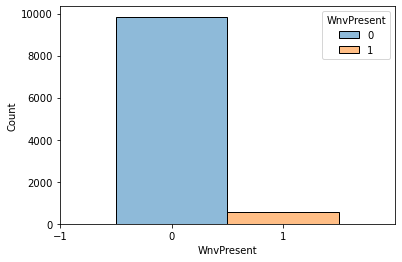

In [17]:
# Plot distribution of positive and negative class for train dataset
plt.xlim([-1, 2])
plt.xticks(np.arange(-1, 2))
sns.histplot(train_df, x='WnvPresent', discrete=True, hue='WnvPresent');

print("\033[4mOverall Distribution of Negative and Positive Class for WnvPresent\033[0m")
print(train_df['WnvPresent'].value_counts(normalize=True))

We see that of all the observations gathered, only 5.28% consist of the positive class. As this represents an imbalanced class problem, data preprocessing or model weight hyperparameter tuning is required in modelling.

#### Number of Locations with Traps Deployed by Year

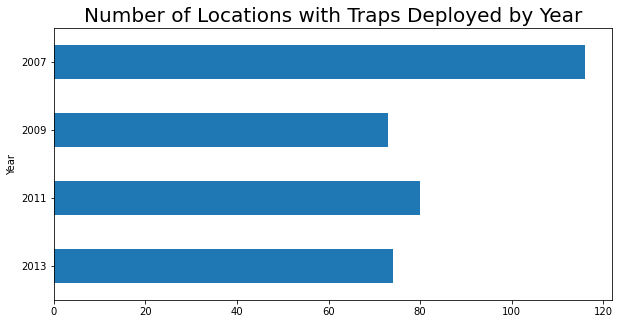

In [18]:
# Plot distribution of number of locations with traps deployed against year
fig, ax1 = plt.subplots(figsize = [10,5]);

train_df.groupby(['Year','Trap']).sum().value_counts('Year').sort_index(ascending = False).plot(kind = "barh", ax=ax1);
ax1.set_title('Number of Locations with Traps Deployed by Year', size = 20);

Number of locations with traps deployed is different throughout the 4 years in our dataset. This suggests directed allocation of resources for more targeted sampling rather than blanket deployment of traps throughout the city of Chicago.

#### Total Number of and Map of Trap Locations

In [19]:
len(train_df['Address'].value_counts())

138

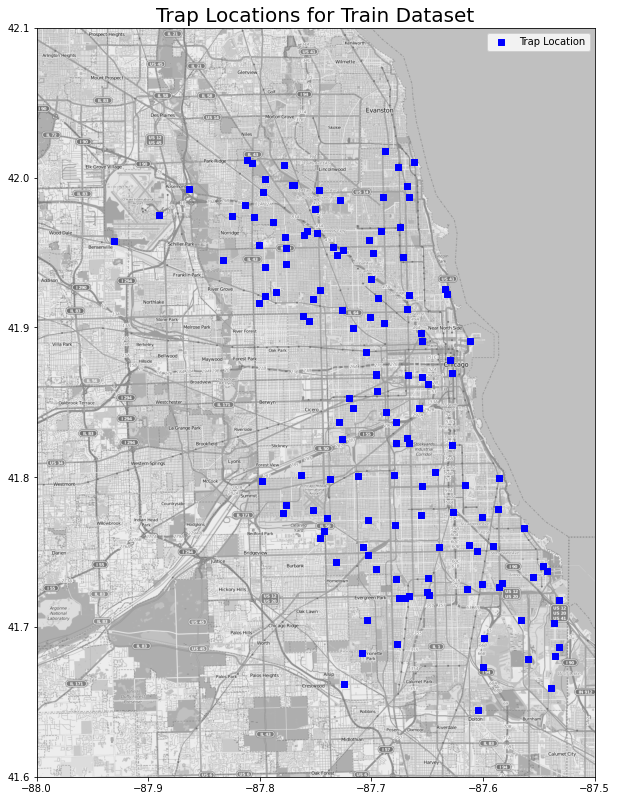

In [20]:
# Plot trap locations on map
mapdata = np.loadtxt("../datasets/mapdata_copyright_openstreetmap_contributors.txt")

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1];
lon_lat_box = (-88, -87.5, 41.6, 42.1);

plt.figure(figsize=(10,14));
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect);

locations = train_df[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='s', color='Blue', label='Trap Location');
plt.title("Trap Locations for Train Dataset", fontsize=20);
plt.legend();

There are 138 unique addresses present in our train dataset. Based on the plot of trap locations, there are certain trap locations that are in close proximity to each other and thus, may be correlated due to geographical proximity.

#### Exploring 'Block' as a Probable Clustering Feature

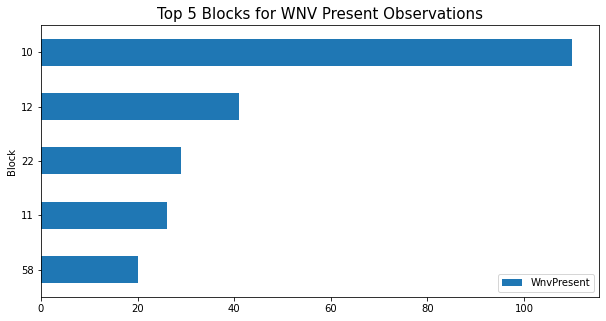

In [21]:
# Plot top 5 block with WNV present
fig, ax1 = plt.subplots(figsize = [10,5]);
block_df = train_df.groupby(['Block']).sum() 
block_df.reset_index(inplace=True)
block_df.sort_values(by = 'WnvPresent', ascending = True).tail(5).plot(kind = "barh", x = 'Block', y = ['WnvPresent'], ax=ax1)
ax1.set_title('Top 5 Blocks for WNV Present Observations', size=15);

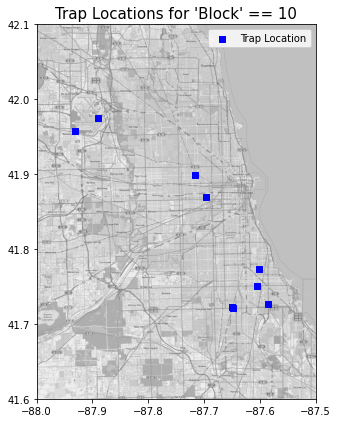

In [22]:
# Plot trap locations for Block 10, top WNV present locations on map
mapdata = np.loadtxt("../datasets/mapdata_copyright_openstreetmap_contributors.txt")

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1];
lon_lat_box = (-88, -87.5, 41.6, 42.1);

plt.figure(figsize=(5,7));
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect);

locations = train_df[train_df['Block'] == 10][['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='s', color='Blue', label='Trap Location');
plt.title("Trap Locations for 'Block' == 10", fontsize=15);
plt.legend();

When looking into top affected location by ```'Block'```, we see that ```'Block' == 10``` was the value that has the most WNV presence. However, when trap locations were plotted on the map, we see that these were not localized into a common area/neighbourhood as previously hypothesised. Thus, for the purpose of this project, figuring out how to cluster trap locations by geographical proximity has to be explored prior to modelling.

#### Top Affected Addresses

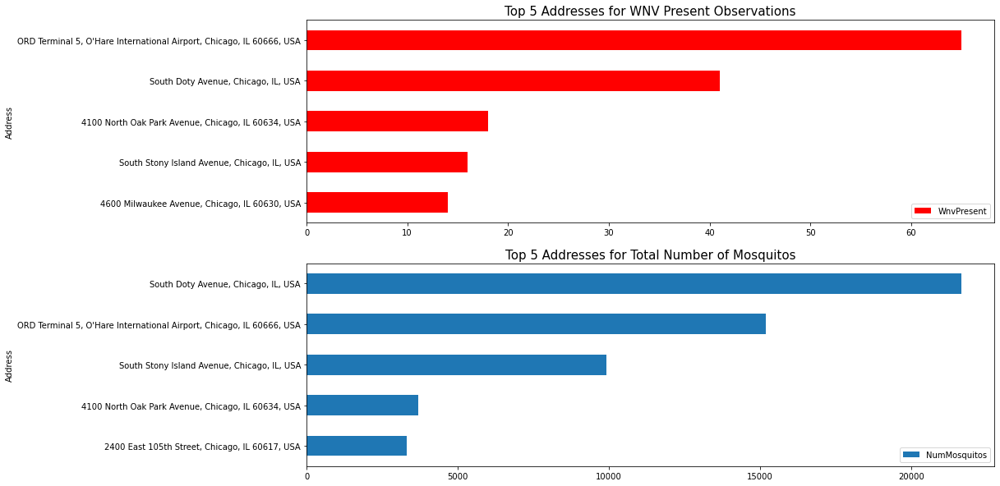

In [23]:
# Plot top affected addresses, WNV and total mosquitos
fig, [ax1, ax2] = plt.subplots(figsize = [25,10], nrows=2, ncols=1)

train_df.groupby('Address').sum().sort_values('WnvPresent').tail().plot(kind='barh', y = 'WnvPresent', figsize = [15,10], ax = ax1, color = 'red');
ax1.set_title('Top 5 Addresses for WNV Present Observations', size=15);
train_df.groupby('Address').sum().sort_values('NumMosquitos').tail().plot(kind='barh', y = 'NumMosquitos', figsize = [15,10], ax = ax2);
ax2.set_title('Top 5 Addresses for Total Number of Mosquitos', size=15);

When we zoom in to the top affected addresses in Chicago for both WNV presence and number of mosquitos, overall we see two locations are a cut above the rest, namely, ```O'Hare International Airport``` and ```South Doty Avenue```. 

One reason why ```O'Hare International Airport``` is highly affected is because it is an international airport serving non-stop flights to 228 destinations in North America, South America, Europe, Africa, Asia and Oceania as of 2018. Coupled with the fact that air traffic's effectiveness in spreading vectors, it is a hot spot for disease vector introduction into the area. [*source*](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1435368/)

From here we can infer that 2007's & 2013's WNV outbreak in Chicago could be caused by an introduction of the virus from external sources. Looking at the the number of cases reported for the whole of US, there was a spike in both 2007 and 2013 as compared to 2009 and 2011, in line with the trends seen in our data.


<p style="text-align: center;"><u>West Nile virus disease cases reported to CDC by state of residence</u></p><br>


|**Year**|2007|2009|2011|2013|
|---|---|---|---|---|
|**Total**|3,630|720|712|2,469|
|||<p style="text-align: center;">[*source*](https://www.cdc.gov/westnile/statsmaps/cumMapsData.html)</p>

For ```South Doty Avenue```, looking at the geographical location we can see that the area has several water bodies (a river, ponds, and lakes) which promotes breeding of mosquitoes. [*source*](https://www.cdc.gov/mosquitoes/about/where-mosquitoes-live.html)

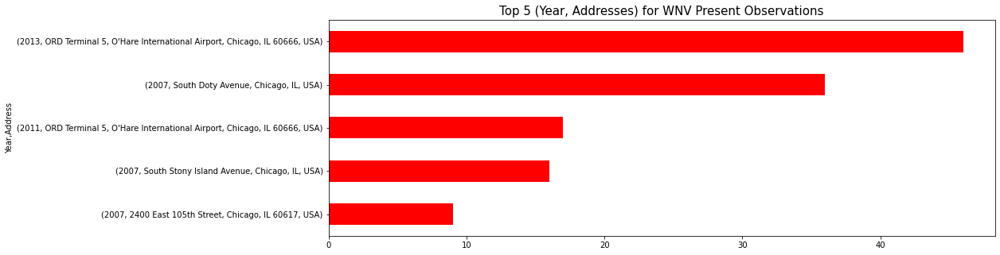

In [24]:
fig, ax1 = plt.subplots(figsize = [15,5]);

train_df.groupby(['Year','Address']).sum()['WnvPresent'].sort_values().tail(5).plot(kind="barh", ax=ax1, color = 'red');
ax1.set_title('Top 5 (Year, Addresses) for WNV Present Observations', size=15);


Even when focusing on the specific year in the "Top 5 (Year, Addresses) for WNV Present Observations" plot above, the two locations are present, with ```South Doty Avenue``` having a high number in 2007 and for ```O'Hare International Airport```, a high number in 2013. This also suggests a shift in the spread of WNV over Chicago over the years.

The spread in the affected areas will be expored in the WNV density graphs in the Spray data section below.

#### Plot of WNV Presence, Superimposed on Normalized Plot of Number of Mosquitos over Time

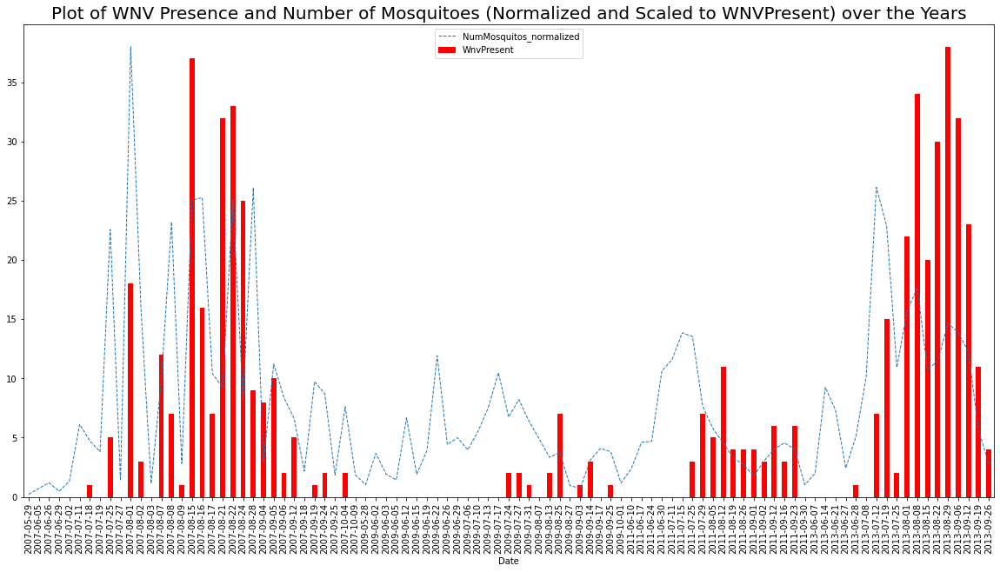

In [25]:
plot_df = pd.DataFrame([train_df.groupby('Date').sum()['NumMosquitos'], train_df.groupby('Date').sum()['WnvPresent']])
plot_df = plot_df.T
plot_df['NumMosquitos_normalized'] = plot_df['NumMosquitos'].map(lambda x: x/plot_df['NumMosquitos'].max() * plot_df['WnvPresent'].max())
plot_df['Date'] = plot_df.index
plot_df['Date'] = plot_df['Date'].map(lambda x: x.strftime('%Y-%m-%d'))


fig, ax1= plt.subplots()
plot_df.plot(kind='line', x = 'Date', y = 'NumMosquitos_normalized', figsize = [20,10], ax = ax1, linestyle ='--', linewidth = 1);
plot_df.plot(kind='bar', x = 'Date', y = 'WnvPresent', figsize = [20,10], ax = ax1, color = 'red');


ax1.set_xticklabels(plot_df['Date'], rotation = 90);

plt.title('Plot of WNV Presence and Number of Mosquitoes (Normalized and Scaled to WNVPresent) over the Years', size = 20);

From here we see that, generally, as the number of mosquitoes trapped goes higher, the number of WNV present observations increases as well. However, although a general positive correlation exists, we do note that there are outliers to the trend, namely:

1) The absence of WNV presence in June/July 2009/2011/2013 even with spikes in number of mosquitoes trapped.<br>
2) The consistently high number of WNV present observations in 2013 even after the total number of mosquitoes trapped trended down.<br>

We will then look into the demographic of mosquito species to see if this trend can be explained.


#### Demographic of Mosquito Species 

In [26]:
train_df.groupby('Species').sum().loc[:, ['NumMosquitos', 'WnvPresent']]

,NumMosquitos,WnvPresent
Species,,
CULEX ERRATICUS,7,0
CULEX PIPIENS,44488,240
CULEX PIPIENS/RESTUANS,65841,261
CULEX RESTUANS,23326,49
CULEX SALINARIUS,144,0
CULEX TARSALIS,7,0
CULEX TERRITANS,508,0


There are 7 categories under the species column with one mixed category, ```CULEX PIPIENS/RESTUANS```, probably due to the difficulty for the data gatherer in determining the exact species of the observation. 

The 6 species in the data coincides with the known mosquito species known to be carriers of the WNV. However, based on the observations seen ```CULEX PIPIENS``` and ```CULEX RESTUANS``` are the only two species that were observed having WNV presence. This is because both subspecies of Culex are the dominant carriers for WNV. Furthermore, research has shown that ```CULEX PIPIENS``` population growth are more subjected to weather conditions, with larvae of ```CULEX RESTUANS``` being numerically dominant in spring and early summer but ```CULEX PIPIENS``` dominates by mid-summer, coinciding with the timeframe of our dataset. The graph below also shows that the two subspecies are dominant on different parts of the year. [*source*](https://pubmed.ncbi.nlm.nih.gov/26314047/#:~:text=Culex%20restuans%20Theobold%20is%20a,pipiens%20dominates%20by%20mid%2Dsummer)

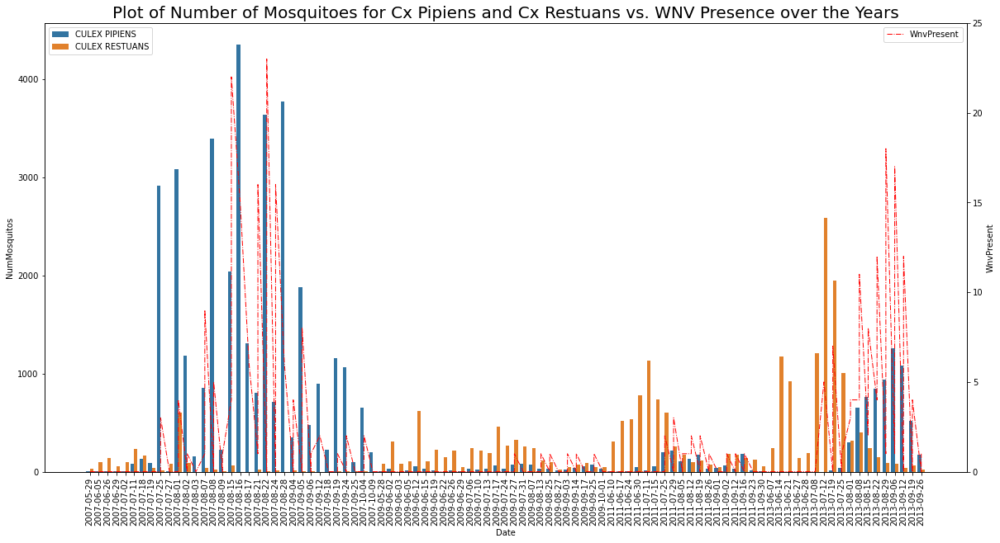

In [27]:
train_subsp = train_df[(train_df['Species']== 'CULEX PIPIENS') | (train_df['Species']== 'CULEX RESTUANS')]
train_subsp_sum = train_subsp.groupby(['Date','Species']).sum()
train_subsp_sum = train_subsp_sum.reset_index()
train_subsp_sum['Date'] = train_subsp_sum['Date'].map(lambda x: x.strftime('%Y-%m-%d'))
fig, ax1= plt.subplots(figsize = [20,10])

sns.barplot(data = train_subsp_sum, x = 'Date', y = 'NumMosquitos', hue = 'Species', ax=ax1);

ax2 = ax1.twinx()
sns.lineplot(data = train_subsp_sum, x = 'Date', y = 'WnvPresent', ax=ax2, estimator=None, lw=1, linestyle='-.', color = 'red', label = 'WnvPresent');
ax1.legend(loc=2)
ax2.legend(loc=0)

ax1.set_xticklabels(train_subsp_sum['Date'].drop_duplicates(), rotation = 90);
ax2.set_ylim(0,25)


plt.title('Plot of Number of Mosquitoes for Cx Pipiens and Cx Restuans vs. WNV Presence over the Years', size = 20);

When isolating just the subspecies of ```CULEX PIPIENS``` and ```CULEX RESTUANS```, and superimposing that on a plot of WNV presence, we see that the spikes on the number of WNV present observations coincides with the spikes in the number of ```CULEX PIPIENS```. This suggests that ```CULEX PIPIENS``` is a more prominent carrier for the virus (and hence, more positively correlated) as compared to ```CULEX RESTUANS```.


Note: ```CULEX PIPIENS/RESTUANS``` was not evaluated here since we assume that this category is for observations that the scientist could not accurately determine the subspecies of the sample. 

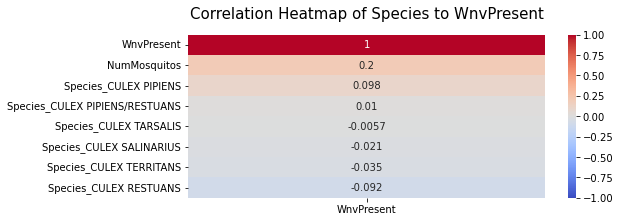

In [28]:
train_species = train_df.loc[:, ['Species', 'NumMosquitos', 'WnvPresent']]
train_species = pd.get_dummies(train_species, drop_first=True)

# Plot heatmap correlating Species to WnvPresent
plt.figure(figsize=(8, 3))
heatmap = sns.heatmap(train_species.corr()[['WnvPresent']].sort_values(by='WnvPresent', ascending=False), vmin=-1, vmax=1, annot=True, cmap='coolwarm')
heatmap.set_title('Correlation Heatmap of Species to WnvPresent', fontdict={'fontsize':15}, pad=16);

From the correlation of certain subspecies of Culex to WnvPresent, we see that `CULEX PIPIENS` and `CULEX RESTUANS` have higher correlations as compared to the others. Hence, we will be dropping the other subspecies in our modelling. 

**Note:** `CULEX PIPIENS/RESTUANS` will be kept despite its low correlation since it has significant number of observations in our dataset. This will be represented by positive classes in both `CULEX PIPIENS` and `CULEX RESTUANS`.

### Final Treatment of Train/Test Datasets

Based on the above, `'Species'` will be dummified and keeping only `CULEX PIPIENS` and `CULEX RESTUANS`. Non-essential columns will be dropped as well. 

In [29]:
train_df = pd.get_dummies(train_df, columns=['Species'], drop_first=True)
train_df['Species_CULEX PIPIENS'] = train_df['Species_CULEX PIPIENS/RESTUANS'].map(lambda x: 1 if x == 1 else 0)
train_df['Species_CULEX RESTUANS'] = train_df['Species_CULEX PIPIENS/RESTUANS'].map(lambda x: 1 if x == 1 else 0)

train_df.drop(['Block', 'Street', 'AddressNumberAndStreet',
               'Species_CULEX SALINARIUS','Species_CULEX TARSALIS',
               'Species_CULEX TERRITANS', 'Species_CULEX PIPIENS/RESTUANS',
               'AddressAccuracy'
              ],axis=1,inplace=True)

In [30]:
test_df = pd.get_dummies(test_df, columns=['Species'], drop_first=True)
test_df['Species_CULEX PIPIENS'] = test_df['Species_CULEX PIPIENS/RESTUANS'].map(lambda x: 1 if x == 1 else 0)
test_df['Species_CULEX RESTUANS'] = test_df['Species_CULEX PIPIENS/RESTUANS'].map(lambda x: 1 if x == 1 else 0)

test_df.drop(['Block', 'Street', 'AddressNumberAndStreet',
               'Species_CULEX SALINARIUS','Species_CULEX TARSALIS',
               'Species_CULEX TERRITANS', 'Species_CULEX PIPIENS/RESTUANS',
               'AddressAccuracy'
              ],axis=1,inplace=True)

## Weather Dataset

### Data dictionary for weather dataset

#### General information

|Feature|Dataset|Description|
|---|---|---|
|Station|weather_df|Refers to station 1 or 2, where the weather observations were taken|
|Date|weather_df|Date at which the weather observations were taken|

#### Temperature related

|Feature|Dataset|Description|
|---|---|---|
|Tmax|weather_df|Highest temperature measured in the day in degrees Fahrenheit|
|Tmin|weather_df|Lowest temperature measured in the day in degrees Fahrenheit|
|Tavg|weather_df|Average temperature measured in the day in degrees Fahrenheit|
|Depart|weather_df|Tavg departure from normal temperature in the day in degrees Fahrenheit|
|DewPoint|weather_df|Average dewpoint, which is the temperature the air needs to be cooled to (at constant pressure) in order to achieve a relative humidity (RH) of 100%|
|WetBulb|weather_df|Average wetbulb, which is the lowest temperature to which air can be cooled by the evaporation of water into the air at a constant pressure.|

#### Degrees days: Base 65F

|Feature|Dataset|Description|
|---|---|---|
|Heat|weather_df|Measurement designed to quantify demand for energy needed to heat a building. Commonly known as Heating degree day [*source*](http://en.wikipedia.org/wiki/Heating_degree_day)|
|Cool|weather_df|Measurement designed to quantify demand for energy needed to cool a building. Commonly known as cooling degree day which quantifies demand for air conditioning [*source*](https://en.wikipedia.org/wiki/Heating_degree_day)|
|Sunrise|weather_df|The calculated timing in 24H format when the sunrises|
|Sunset|weather_df|The calculated timing in 24H format when the sunrises|

#### Significant weather types

|Feature|Dataset|Description|
|---|---|---|
|CodeSum|weather_df|Coarse description of the daily weather, notated in 2 alphabet format|


#### Snow and ice related

|Feature|Dataset|Description|
|---|---|---|
|Depth|weather_df|Snow or ice depth in inches. Noted 0 and 'M' as common values|
|Water1|weather_df|Water equivalent, noted 'M' as common values|

#### Precipitation related

|Feature|Dataset|Description|
|---|---|---|
|SnowFall|weather_df|Snowfall measurement|
|PrecipTotal|weather_df|Precipitation total in 24 hour time period measured in inches|

#### Pressure related

|Feature|Dataset|Description|
|---|---|---|
|StnPressure|weather_df|Average station pressure measured in HG|
|SeaLevel|weather_df|Average sea level pressure measured in HG|


#### Wind related

|Feature|Dataset|Description|
|---|---|---|
|ResultSpeed|weather_df|Resultant windspeed|
|ResultDir|weather_df|Resultant direction in whole degrees|
|AvgSpeed|weather_df|Average windspeed|


### Treatment of Weather Dataset

In [31]:
weather_df.shape

(2944, 22)

In [32]:
weather_df.head()

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,14,51,56,0,2,0448,1849,,0,M,0.0,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68,M,51,57,0,3,-,-,,M,M,M,0.00,29.18,29.82,2.7,25,9.6
2,1,2007-05-02,59,42,51,-3,42,47,14,0,0447,1850,BR,0,M,0.0,0.00,29.38,30.09,13.0,4,13.4
3,2,2007-05-02,60,43,52,M,42,47,13,0,-,-,BR HZ,M,M,M,0.00,29.44,30.08,13.3,2,13.4
4,1,2007-05-03,66,46,56,2,40,48,9,0,0446,1851,,0,M,0.0,0.00,29.39,30.12,11.7,7,11.9


In [33]:
weather_df.columns

Index(['Station', 'Date', 'Tmax', 'Tmin', 'Tavg', 'Depart', 'DewPoint',
       'WetBulb', 'Heat', 'Cool', 'Sunrise', 'Sunset', 'CodeSum', 'Depth',
       'Water1', 'SnowFall', 'PrecipTotal', 'StnPressure', 'SeaLevel',
       'ResultSpeed', 'ResultDir', 'AvgSpeed'],
      dtype='object')

There are a total of 22 columns of data. For each observation, there is one of each from station 1 and station 2.

#### Check for null values

In [34]:
# Check for null values
weather_df.isnull().sum()

Station        0
Date           0
Tmax           0
Tmin           0
Tavg           0
Depart         0
DewPoint       0
WetBulb        0
Heat           0
Cool           0
Sunrise        0
Sunset         0
CodeSum        0
Depth          0
Water1         0
SnowFall       0
PrecipTotal    0
StnPressure    0
SeaLevel       0
ResultSpeed    0
ResultDir      0
AvgSpeed       0
dtype: int64

We noted that there were no null values. However on closer inspection of the data, the data contains 'M' and 'T' meaning missing and trace, which will be treated in the following sections.

#### `Depart`

In [35]:
weather_df[weather_df['Depart']=='M'].shape

(1472, 22)

There are a total of 1,472 rows with 'M' values for `'Depart'`, which is exactly half the dataset of 2,944.

In [36]:
weather_df[weather_df['Depart']=='M'].head()

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
1,2,2007-05-01,84,52,68,M,51,57,0,3,-,-,,M,M,M,0.00,29.18,29.82,2.7,25,9.6
3,2,2007-05-02,60,43,52,M,42,47,13,0,-,-,BR HZ,M,M,M,0.00,29.44,30.08,13.3,2,13.4
5,2,2007-05-03,67,48,58,M,40,50,7,0,-,-,HZ,M,M,M,0.00,29.46,30.12,12.9,6,13.2
7,2,2007-05-04,78,51,M,M,42,50,M,M,-,-,,M,M,M,0.00,29.36,30.04,10.1,7,10.4
9,2,2007-05-05,66,54,60,M,39,50,5,0,-,-,,M,M,M,T,29.46,30.09,11.2,7,11.5


In [37]:
weather_df[weather_df['Depart']=='M'].groupby('Station').sum()

,Tmax,Tmin,DewPoint,ResultSpeed,ResultDir
Station,,,,,
2,112392,86686,78808,10207.2,25515


On closer inspection, it was noted that all the 'M' values belongs to Station 2. 

`Depart` is a calculation of how far the Average temperature (Tavg) departs from the usual temperature at the station (T0). Tavg can be computed using (Tmax+Tmin/2). It was noted also that there is rounding up of temperature in the data.

We have chosen to take the max value between station 1 and station 2 to quickly impute the value of `Depart`.

#### `CodeSum`

In [38]:
# Create value counts by station for each timing, in descending order - for CodeSum
weather_df.groupby('CodeSum')['Station'].value_counts().sort_values(ascending=False)

CodeSum              Station
                     1          805
                     2          804
RA                   1          161
                     2          135
RA BR                1          128
                               ... 
TS TSRA RA FG BR HZ  1            1
TS TSRA RA HZ        2            1
TS TSRA RA VCTS      2            1
TS TSRA VCFG         2            1
FG+                  2            1
Name: Station, Length: 140, dtype: int64

Noted that there are many different values, sometimes clumped together, or even blanks for `'CodeSum'` column. Since this is just a coarse description of what the weather is like, it might be helpful to investigate the relationships to `'WnvPresent'` and `'NumMosquitos'`. CountVectorizer will be used to help extract keywords.

In [39]:
# Instantiate CountVectorizer, fit and transform 'CodeSum' column
cvec = CountVectorizer()
weather_types = cvec.fit_transform(weather_df['CodeSum'])

# Create dataframe for weather_types
weather_types = pd.DataFrame(
    weather_types.todense(),
    columns = cvec.get_feature_names_out()
            )

# Evaluate types of weather for combined weather types
weather_types.sum().sort_values(ascending=False)

ra      935
br      813
tsra    305
hz      263
dz      133
ts      102
fg       43
vcts     19
fu        9
sn        6
bcfg      5
vcfg      4
mifg      3
sq        3
gr        1
dtype: int64

Perusing through the weather types, only `tsra` looked like a combined weather type of thunderstorm and rain, which is already in the categories `ts` and `ra`. However, we noted that `tsra` happens at times as a standalone weather, in the absence of `ts` or `ra`. This suggests that it is similarly to be treated as a separate weather type. Others like `vcts`, `bcfg`, `vcfg`, and `mifg` have been investigated, and they are not combined weather types, but talking about severity of fog and thunderstorm. Based on empirical data, there's a robust positive significant correlation between precipitation and mosquito activity, through the activation of their breeding sites. [*source*](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7068582/) Thus, we will be using weather types that corresponds to precipitation for the model.

In [40]:
# Concatenate weather_df with weather_types
weather_df = pd.concat(objs=[weather_df, weather_types], axis=1)

weather_df.head()

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed,bcfg,br,dz,fg,fu,gr,hz,mifg,ra,sn,sq,ts,tsra,vcfg,vcts
0,1,2007-05-01,83,50,67,14,51,56,0,2,0448,1849,,0,M,0.0,0.00,29.10,29.82,1.7,27,9.2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,2007-05-01,84,52,68,M,51,57,0,3,-,-,,M,M,M,0.00,29.18,29.82,2.7,25,9.6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,2007-05-02,59,42,51,-3,42,47,14,0,0447,1850,BR,0,M,0.0,0.00,29.38,30.09,13.0,4,13.4,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2,2007-05-02,60,43,52,M,42,47,13,0,-,-,BR HZ,M,M,M,0.00,29.44,30.08,13.3,2,13.4,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0
4,1,2007-05-03,66,46,56,2,40,48,9,0,0446,1851,,0,M,0.0,0.00,29.39,30.12,11.7,7,11.9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [41]:
# Drop CodeSum columns and non-Precipitation weather types
weather_df.drop(columns=[
    'CodeSum',
    'bcfg',
    'fu',
    'gr',
    'mifg',
    'sn',
    'sq',
    'vcfg',
    'fg',
    'br', 
    'hz', 
], inplace=True)

#### `Sunrise` and `Sunset`

In [42]:
# Create value counts by station for each timing, in descending order - for Sunrise
weather_df.groupby('Sunrise')['Station'].value_counts().sort_values(ascending=False)

Sunrise  Station
-        2          1472
0416     1           104
0417     1            64
0419     1            40
0422     1            32
                    ... 
0514     1             8
0513     1             8
0512     1             8
0511     1             8
0623     1             8
Name: Station, Length: 122, dtype: int64

In [43]:
# Create value counts by station for each timing, in descending order - for Sunset
weather_df.groupby('Sunset')['Station'].value_counts().sort_values(ascending=False)

Sunset  Station
-       2          1472
1931    1            96
1930    1            56
1929    1            48
1928    1            32
                   ... 
1744    1             8
1742    1             8
1741    1             8
1739    1             8
1824    1             8
Name: Station, Length: 119, dtype: int64

Here we can observe that there are empty values for both `Sunrise` and `Sunset` denoted by '-'. They also all belong to station 2 as well. Thus for each day, we will use the observation of Station 1.

#### `Depth`, `Water1`, `SnowFall`, `PrecipTotal`

In [44]:
# Create value counts by station for each timing, in descending order - for Depth
weather_df.groupby('Depth')['Station'].value_counts().sort_values(ascending=False)

Depth  Station
0      1          1472
M      2          1472
Name: Station, dtype: int64

All of the values are 0 and 'M'. We propose to drop the column as a feature since there is not much movement in depth in Station 1, and also in view that there is a large amount of missing information cause by Station 2. 

In [45]:
# Create value counts by station for each timing, in descending order - for Water1
weather_df.groupby('Water1')['Station'].value_counts().sort_values(ascending=False)

Water1  Station
M       1          1472
        2          1472
Name: Station, dtype: int64

All of the values are blank and 'M'. We propose to drop the column as a feature in view that there is a large amount of missing information.

In [46]:
# Create value counts by station for each timing, in descending order - for SnowFall
weather_df.groupby('SnowFall')['Station'].value_counts().sort_values(ascending=False)

SnowFall  Station
M         2          1472
0.0       1          1459
  T       1            12
0.1       1             1
Name: Station, dtype: int64

Noted that there is mostly no snow measured in Station 1, other than 1 observation of 0.1 and 1 observation of trace. Furthermore, there is a large number of missing information from Station 2. In view of a lack of variance and also a large proportion of missing data, we propose to drop the column as a feature.

In [47]:
# Create value counts by station for each timing, in descending order - for PrecipTotal
weather_df.groupby('PrecipTotal')['Station'].value_counts().sort_values(ascending=False)

PrecipTotal  Station
0.00         1          794
             2          783
  T          1          163
             2          155
0.01         2           73
                       ... 
1.06         1            1
1.05         1            1
0.73         2            1
1.04         1            1
1.18         2            1
Name: Station, Length: 256, dtype: int64

We noted that a large number of values, total of 168, are present in PrecipTotal, with most occurences being 0 or low amounts of precipitation.

In [48]:
# Count number of unique observations for 'PrecipTotal'
weather_df['PrecipTotal'].nunique()

168

#### Treatment of Values in Dataset

In [49]:
#Below is to replace values with 'M' with the max of the value of the day in alternate station, 
#otherwise replace value with 0 if there is also no value from alternate station

for i in range(len(weather_df)):
    if weather_df.iloc[i,7]=='M':
        weather_df.iloc[i,7]=0
        compare_df=weather_df[(weather_df['Date']==weather_df.iloc[i,1])]
        weather_df.iloc[i,7]=compare_df['WetBulb'].astype(int).max()
        
for i in range(len(weather_df)):
    if weather_df.iloc[i,4]=='M':
        weather_df.iloc[i,4]=0
        compare_df=weather_df[(weather_df['Date']==weather_df.iloc[i,1])]
        weather_df.iloc[i,4]=compare_df['Tavg'].astype(int).max()

for i in range(len(weather_df)):
    if weather_df.iloc[i,5]=='M':
        weather_df.iloc[i,5]=0
        compare_df=weather_df[(weather_df['Date']==weather_df.iloc[i,1])]
        weather_df.iloc[i,5]=compare_df['Depart'].astype(int).max()

        
for i in range(len(weather_df)):
    if weather_df.iloc[i,8]=='M':
        weather_df.iloc[i,8]=0
        compare_df=weather_df[(weather_df['Date']==weather_df.iloc[i,1])]
        weather_df.iloc[i,8]=compare_df['Heat'].astype(int).max()

for i in range(len(weather_df)):
    if weather_df.iloc[i,9]=='M':
        weather_df.iloc[i,9]=0
        compare_df=weather_df[(weather_df['Date']==weather_df.iloc[i,1])]
        weather_df.iloc[i,9]=compare_df['Cool'].astype(int).max()

for i in range(len(weather_df)):
    if weather_df.iloc[i,10]=='-':
        weather_df.iloc[i,10]=0
        compare_df=weather_df[(weather_df['Date']==weather_df.iloc[i,1])]
        weather_df.iloc[i,10]=compare_df['Sunrise'].astype(int).max()

        
for i in range(len(weather_df)):
    if weather_df.iloc[i,11]=='-':
        weather_df.iloc[i,11]=0
        compare_df=weather_df[(weather_df['Date']==weather_df.iloc[i,1])]
        weather_df.iloc[i,11]=compare_df['Sunset'].astype(int).max()

for i in range(len(weather_df)):
    if (weather_df.iloc[i,14]==('  T')):
        weather_df.iloc[i,14]=0
        
        
for i in range(len(weather_df)):
    if (weather_df.iloc[i,15]==('  T')):
        weather_df.iloc[i,15]=0
    elif (weather_df.iloc[i,15]=='M'):
        weather_df.iloc[i,15]=0
        
for i in range(len(weather_df)):
      if weather_df.iloc[i,16]=='M':
            weather_df.iloc[i,16]=0
  

for i in range(len(weather_df)):
    if weather_df.iloc[i,17]=='M':
        weather_df.iloc[i,17]=0
        compare_df=weather_df[(weather_df['Date']==weather_df.iloc[i,1])]
        weather_df.iloc[i,17]=compare_df['SeaLevel'].astype(float).max()

for i in range(len(weather_df)):
    if weather_df.iloc[i,20]=='M':
        weather_df.iloc[i,20]=0
        compare_df=weather_df[(weather_df['Date']==weather_df.iloc[i,1])]
        weather_df.iloc[i,20]=compare_df['AvgSpeed'].astype(float).max()    
        
weather_df['WetBulb']=weather_df['WetBulb'].astype(int)        
weather_df['Tavg']=weather_df['Tavg'].astype(int)    
weather_df['Depart']=weather_df['Depart'].astype(int)             
weather_df['Heat']=weather_df['Heat'].astype(int)        
weather_df['Cool']=weather_df['Cool'].astype(int)        
weather_df['Sunrise']=weather_df['Sunrise'].astype(int)        
weather_df['Sunset']=weather_df['Sunset'].astype(int)        
weather_df['PrecipTotal']=weather_df['PrecipTotal'].astype(float)     
weather_df['StnPressure']=weather_df['StnPressure'].astype(float)  
weather_df['SeaLevel']=weather_df['SeaLevel'].astype(float)  
weather_df['AvgSpeed']=weather_df['AvgSpeed'].astype(float)  

weather_df.to_csv('../datasets/result.csv', index=False)

weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Station      2944 non-null   int64  
 1   Date         2944 non-null   object 
 2   Tmax         2944 non-null   int64  
 3   Tmin         2944 non-null   int64  
 4   Tavg         2944 non-null   int64  
 5   Depart       2944 non-null   int64  
 6   DewPoint     2944 non-null   int64  
 7   WetBulb      2944 non-null   int64  
 8   Heat         2944 non-null   int64  
 9   Cool         2944 non-null   int64  
 10  Sunrise      2944 non-null   int64  
 11  Sunset       2944 non-null   int64  
 12  Depth        2944 non-null   object 
 13  Water1       2944 non-null   object 
 14  SnowFall     2944 non-null   object 
 15  PrecipTotal  2944 non-null   float64
 16  StnPressure  2944 non-null   float64
 17  SeaLevel     2944 non-null   float64
 18  ResultSpeed  2944 non-null   float64
 19  Result

Weather:

- Imputed missing values for `'Tavg`', `'WetBulb`',`'Depart`',`'Heat`',`'Cool`',`'Sunrise`', `'Sunset`' with values from altenate station if available
- Imputed 'T' or 'M' values with 0 for `'SnowFall`',`'PrecipTotal`', `'StnPressure`'
- Split and recombined CodeSum to create proper spacing between different codes
- Changed Date from string object to datetime64
- Transformed the features `'Tavg`', `'WetBulb`',`'Depart`',`'Heat`',`'Cool`',`'Sunrise`', `'Sunset`', `'SnowFall`',`'PrecipTotal`', `'StnPressure`', `'SeaLevel`', `'AvgSpeed`' into float values


In [50]:
weather_df = weather_df.drop(['Depth','Water1','SnowFall'],axis=1)

As stated in the previous section, values in `'Depth'`,`'Water1'` and `'SnowFall'` are either 0 or M, low variance. Thus, we will be dropping `Depth`, `Water1`, `SnowFall` parameters here.

In [51]:
# Set date parameter as index
weather_df['Date']=pd.to_datetime(weather_df['Date'])
weather_df.set_index('Date', inplace=True)
weather_df.sort_index(inplace=True)

We use the resampling function on dataset by day, thereby collapsing the data, so that there is 1 unique row for each `'Date'`. Following that, null values in the datatset are once again being checked.

In [52]:
weather_df.resample('D').max().isnull().sum()

Station        1269
Tmax           1269
Tmin           1269
Tavg           1269
Depart         1269
DewPoint       1269
WetBulb        1269
Heat           1269
Cool           1269
Sunrise        1269
Sunset         1269
PrecipTotal    1269
StnPressure    1269
SeaLevel       1269
ResultSpeed    1269
ResultDir      1269
AvgSpeed       1269
dz             1269
ra             1269
ts             1269
tsra           1269
vcts           1269
dtype: int64

Based on above result, there are a lot of null records. All the null records are created after the performance of resampling by day and these records are not present in the original dataset. We have established that it is fine to proceed to drop all the null values from the dataset.

In [53]:
weather_df=weather_df.resample('D').mean()
weather_df.dropna(inplace=True)

### Exploring Weather Dataset

#### Correlation of Weather Features

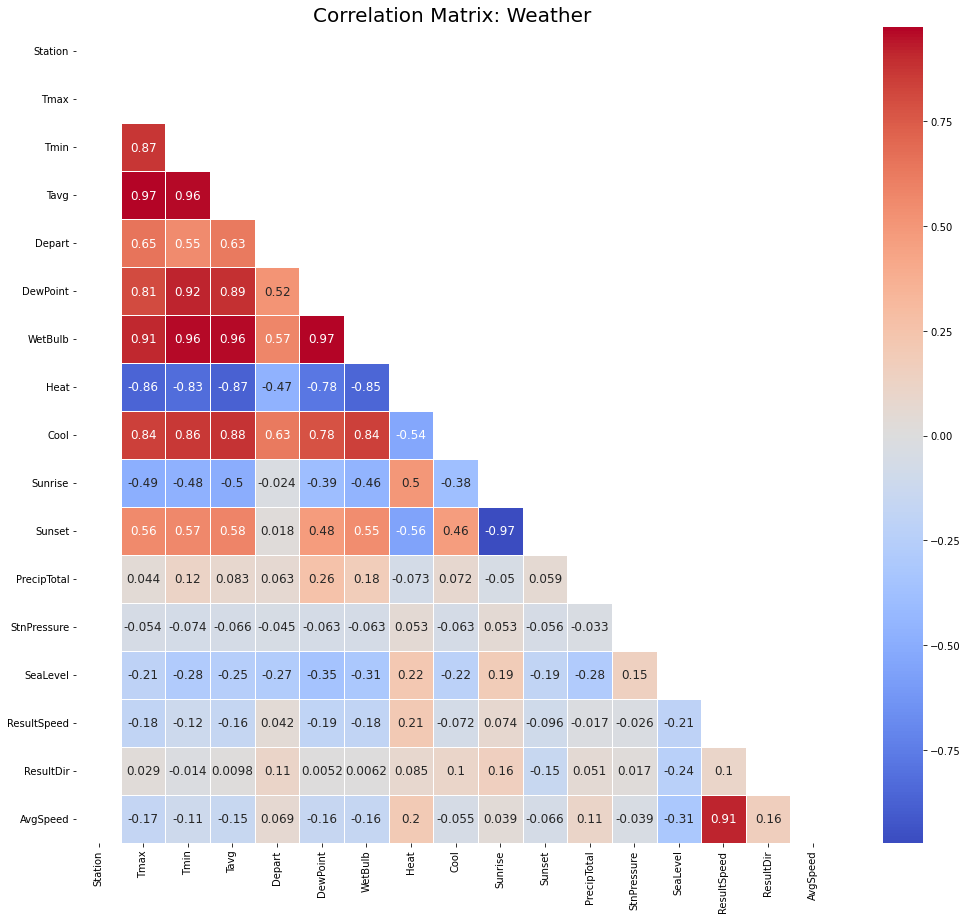

In [54]:
# Plot heatmap correlation matrix for weather dataframe, correlation index set to 17 to avoid CodeSum features
correlations = weather_df.corr()
corr_list = [x for x in correlations.index[0:17]]

fig, ax = plt.subplots(figsize=(17, 15))
masks = np.triu(weather_df[corr_list].corr())
ax = sns.heatmap(weather_df[corr_list].corr(), annot=True, linewidths=1, cmap="coolwarm", annot_kws={"size": 12}, mask=masks)
ax.set_title('Correlation Matrix: Weather ', fontsize=20);

Observed high correlation between `'TAvg'` and other parameters like `'TMax'`, `'TMin'`, `'DewPoint'`,`'WetBulb'`,`'Cool'`. This comes as no surprise as they are all temperature related features.

Also observed high correlation between `AvgSpeed` and `ResultSpeed`, both features related to wind speed.

As part of feature engineering in notebook part 2, we will further investigating the pairwise correlation of parameters, and deciding which features to drop.

In [56]:
# Set the 'Date' column as the index column and sort the column
train_weather_df=pd.merge(train_df, weather_df,  left_on='Date',right_index=True)
train_weather_df.set_index('Date', inplace=True)
train_weather_df.sort_index(inplace=True)


To help further visualise relationships with weather, further plotting of scatterplots and regplots are done below.

In [58]:
# Create scatterplot function 
# Custom function for plotting of weather features
def scatterplot_(df, columnnames, yaxis):    
    nrows = int(np.ceil(len(columnnames)/2))
    ncols = 2
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 30))
    ax = ax.ravel()
    
    for i, column in enumerate(columnnames):
        g = sns.scatterplot(data=df, x=column, y=yaxis, hue='WnvPresent',ax=ax[i], ci=None, color='skyblue')
        ax[i].set_title(column, fontsize=14)
        ax[i].set_xlabel('')
        ax[i].get_legend().remove()
        
    
    # Hide unused plots
    for i in range(nrows * ncols - len(columnnames)):
        ax[-i-1].set_visible(False) # Start from -1
    
    plt.tight_layout()
    plt.suptitle('Scatterplot weather against number of mosquitos, orange is WnvPresent', fontsize=20, y=1.015)

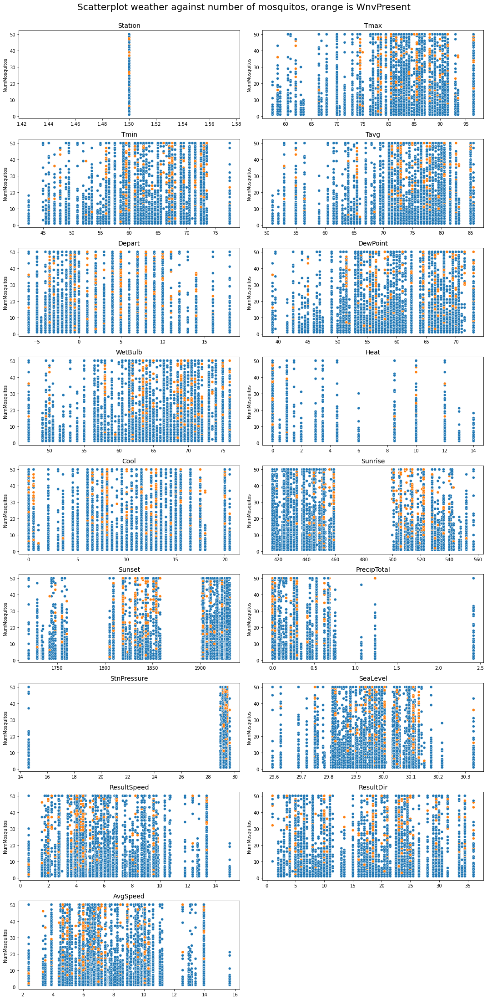

In [59]:
# Plot scatterplots to visualise NumMosquitos against weather features. 
# Column to 17 to omit CodeSum features, visualised separately
scatterplot_(train_weather_df, weather_df.columns[0:17], 'NumMosquitos')

Based on the scatterplot above, the relationship between weather features and WNV presence is very unclear. The true relationship between weather and WNV presence may simply be nuanced, and we cannot pick up the relationship simply with our eyes.

There are several general trends, such as temperature and WNV presence. We also observed that there is an increase in number of blue and orange dots as total precipitation decreases. 

In [60]:
# Create regplot function 
# Custom function for plotting of weather features
def regplot_(df, columnnames, yaxis):    
    nrows = int(np.ceil(len(columnnames)/2))
    ncols = 2
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 30))
    ax = ax.ravel()
    
    for i, column in enumerate(columnnames):
        g = sns.regplot(data=df, x=column, y=yaxis, ax=ax[i], ci=None, color='skyblue', line_kws={'color': 'red'})
        ax[i].set_title(column, fontsize=14)
        ax[i].set_xlabel('')
        
    
    # Hide unused plots
    for i in range(nrows * ncols - len(columnnames)):
        ax[-i-1].set_visible(False) # Start from -1
    
    plt.tight_layout()
    plt.suptitle('Regplot weather against number of mosquitos', fontsize=20, y=1.015)

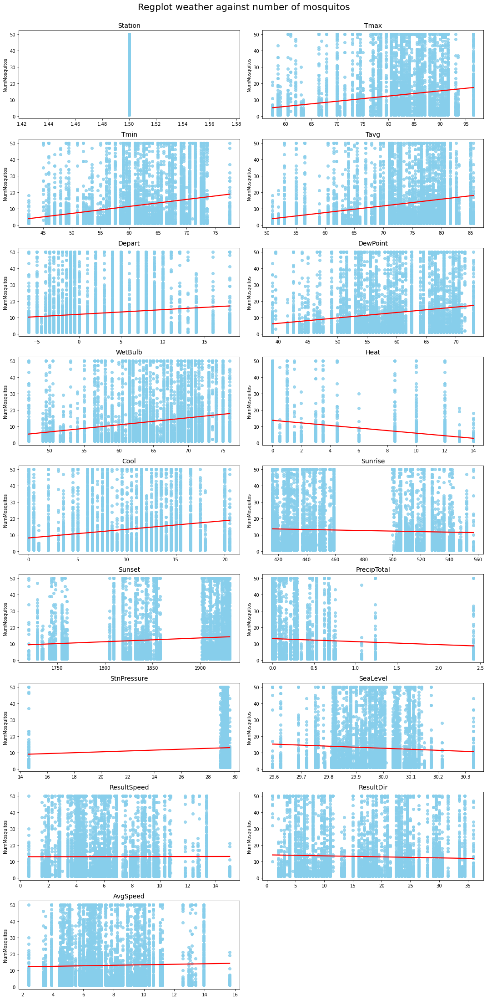

In [61]:
# Plot scatterplots to visualise NumMosquitos against weather features. 
# Column to 17 to omit CodeSum features, visualised separately
regplot_(train_weather_df, weather_df.columns[0:17], 'NumMosquitos')

We do spot a general trend of higher temperature features leading to higher number of `'WnvPresent'` and `'NumMosquitos'`. The slope is gentle, suggesting that the relationship is there but not a very strong one. Once again, the other features seems to give inconclusive relationships that are relatively gentle in slope for the regression line drawn by regplot.This once again points to us that the true relationship might be so nuanced that our human eye cannot pick it up, and reliance on machine learning might be helpful.

We delve in deeper to plot several features relationships with number of WNV detection on a yearly basis, to unfold the confounded relationship over the years.

#### Temperature related barplots for sum of WNV occurences in 2007, 2009, 2011 and 2014

Generally, the trend of higher temperature leading to more West Nile Virus detection stands. Indeed, some years have higher occurences of WNV happening at moderate temperatures. We thus see that as we only have 4 datapoints in years, such instances weakens the true relationship between temperature and WNV occurence.

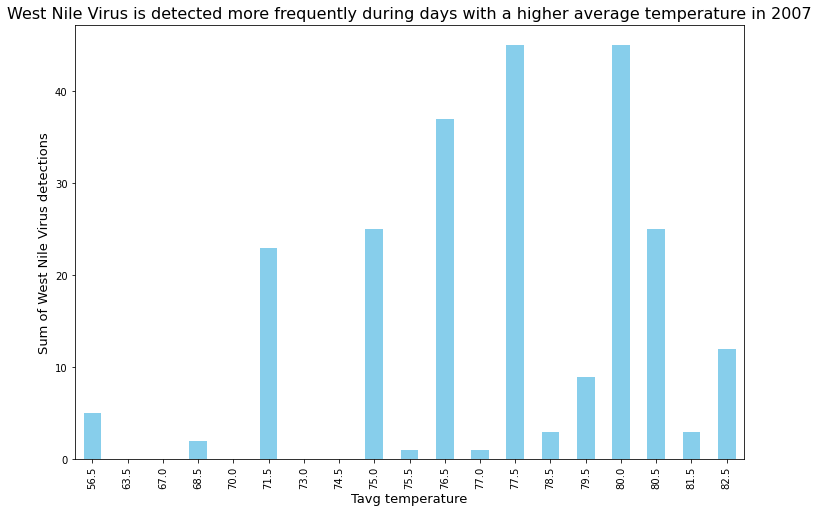

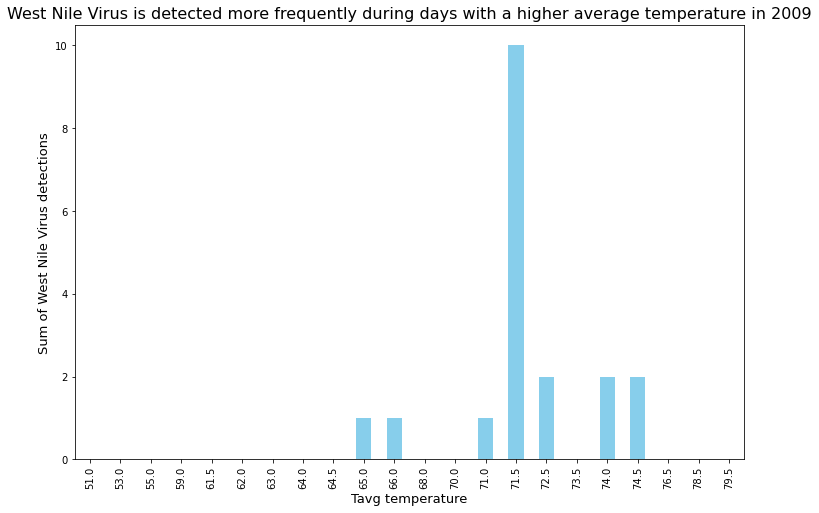

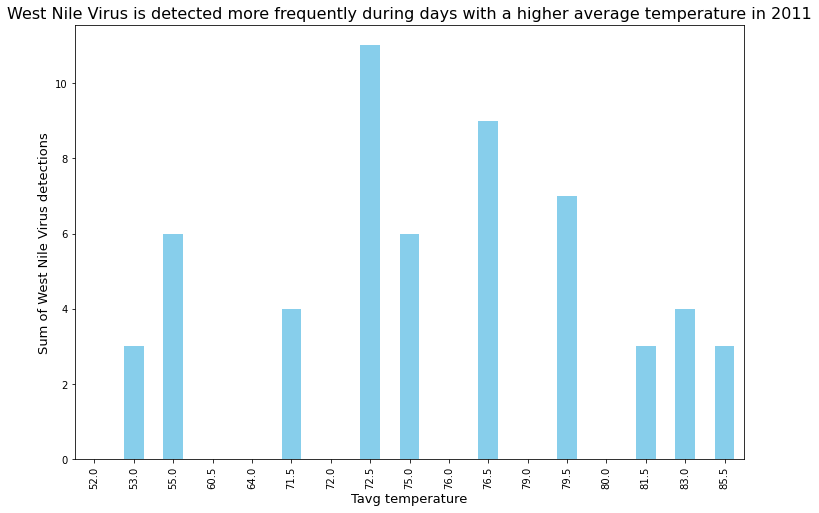

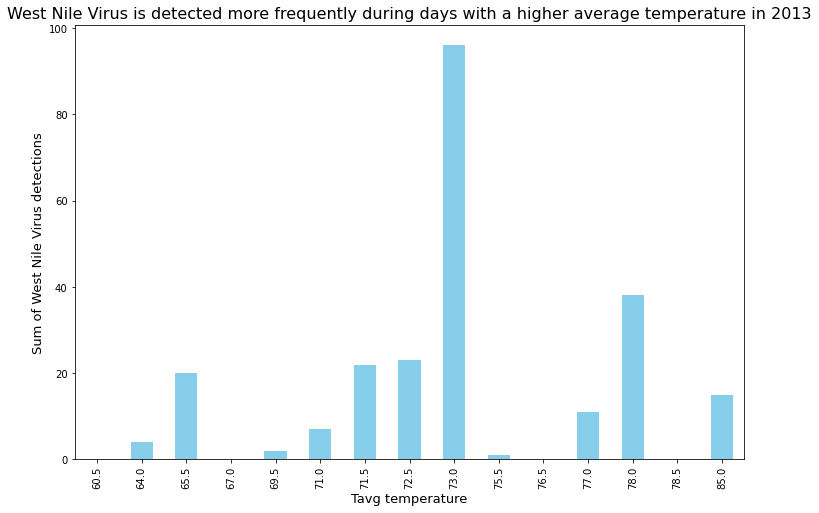

In [62]:
for x in train_weather_df['Year'].unique():
    plt.figure(figsize=(12,8))
    train_weather_df[train_weather_df['Year']==x].groupby(['Tavg'])['WnvPresent'].sum().plot.bar(color='skyblue') 
    plt.title(f"West Nile Virus is detected more frequently during days with a higher average temperature in {x}", fontsize=16)
    plt.xlabel("Tavg temperature", fontsize =13)
    plt.xticks(rotation=90)
    plt.ylabel("Sum of West Nile Virus detections", fontsize=13)

#### Precipitation barplots for sum of WNV occurences in 2007, 2009, 2011 and 2014

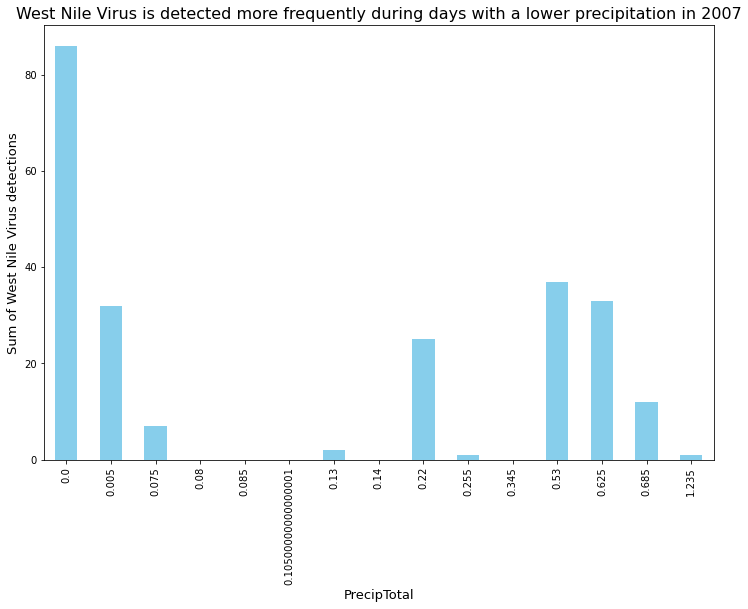

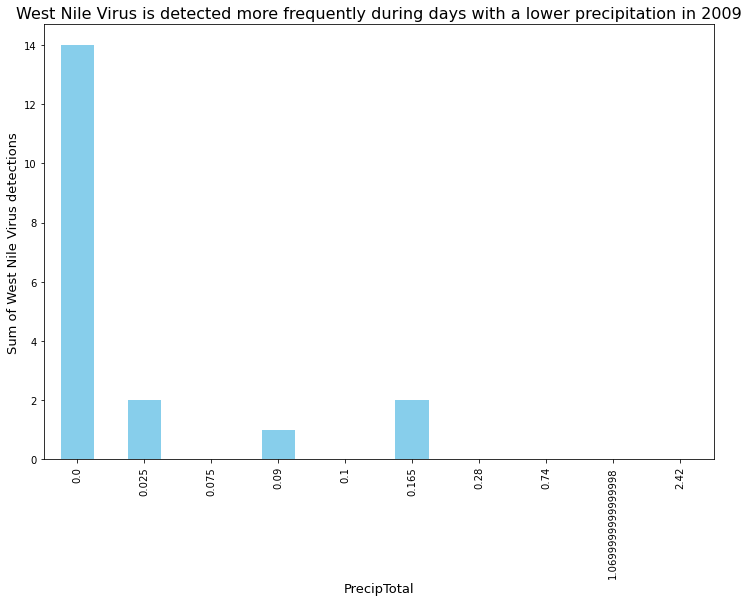

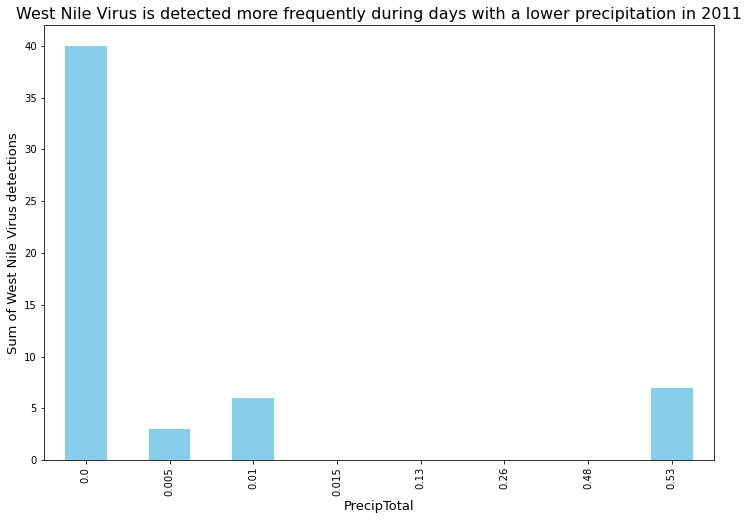

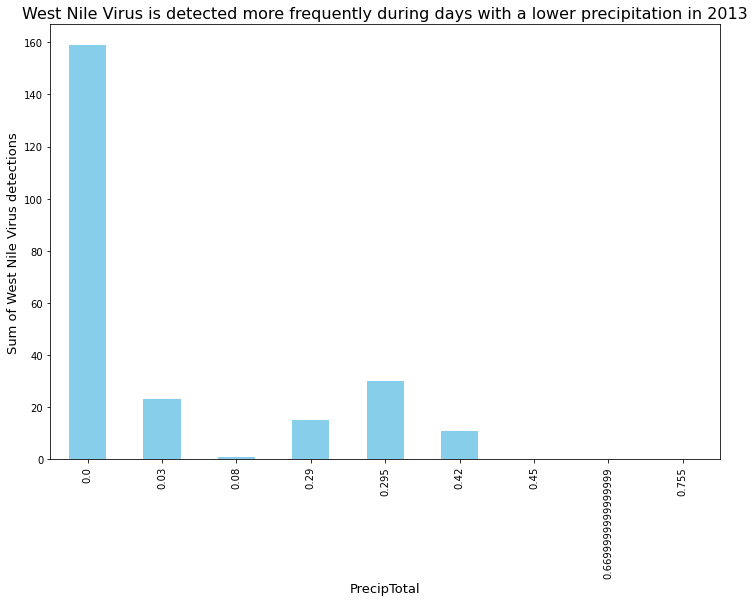

In [65]:
for x in train_weather_df['Year'].unique():
    plt.figure(figsize=(12,8))
    train_weather_df[train_weather_df['Year']==x].groupby(['PrecipTotal'])['WnvPresent'].sum().plot.bar(color='skyblue') 
    plt.title(f"West Nile Virus is detected more frequently during days with a lower precipitation in {x}", fontsize=16)
    plt.xlabel("PrecipTotal", fontsize =13)
    plt.xticks(rotation=90)
    plt.ylabel("Sum of West Nile Virus detections", fontsize=13)

Contrary to our initial hunch, where rain will allow breeding of mosquitos, the findings from precipitation seems to suggest that mosquitos will be relatively dormant during days with heavy rainfall and have less chances of being detected on such days.

#### Pressure related barplots for sum of WNV occurences in 2007, 2009, 2011 and 2014

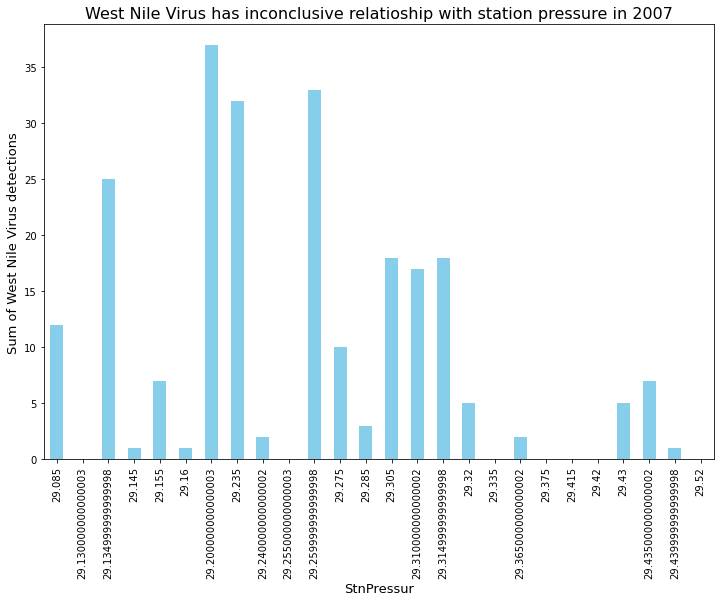

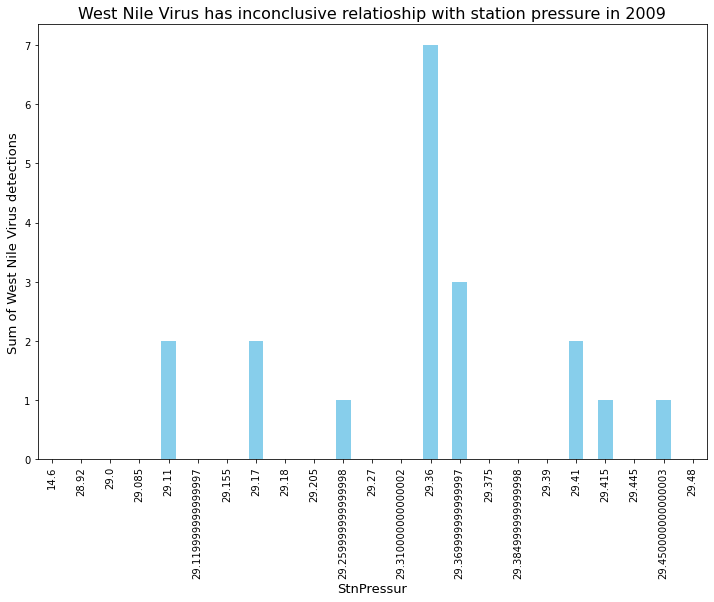

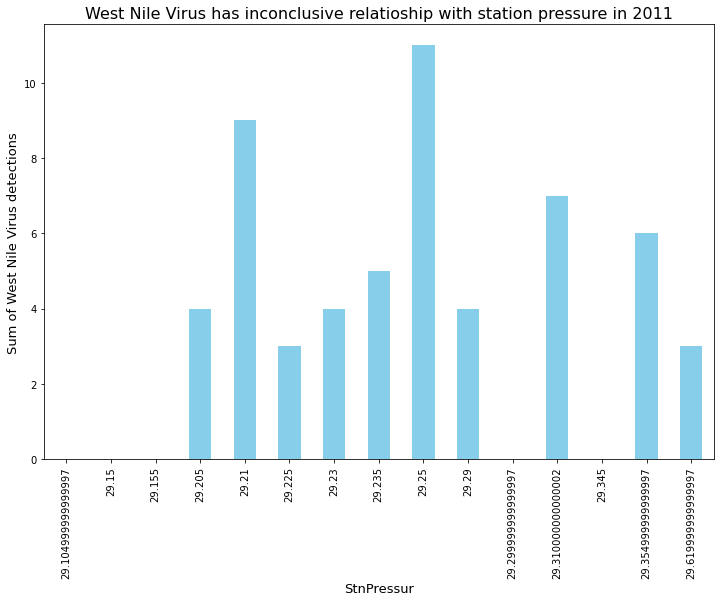

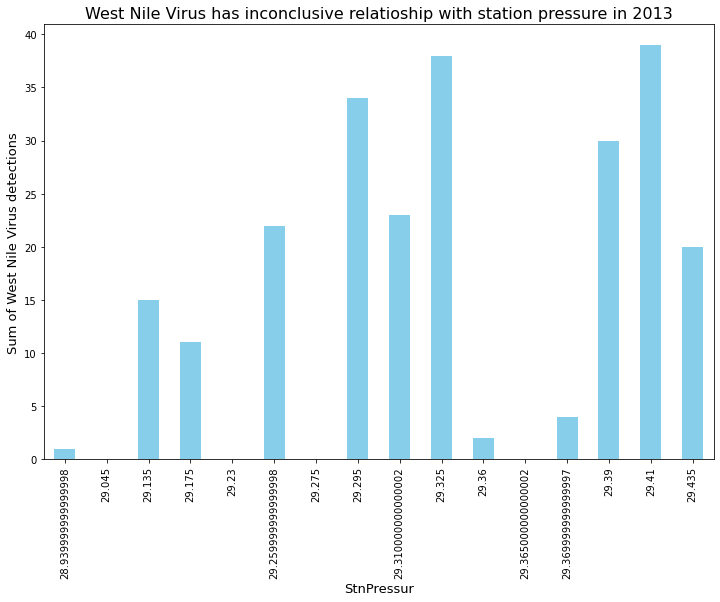

In [66]:
for x in train_weather_df['Year'].unique():
    plt.figure(figsize=(12,8))
    train_weather_df[train_weather_df['Year']==x].groupby(['StnPressure'])['WnvPresent'].sum().plot.bar(color='skyblue') 
    plt.title(f"West Nile Virus has inconclusive relatioship with station pressure in {x}", fontsize=16)
    plt.xlabel("StnPressur", fontsize =13)
    plt.xticks(rotation=90)
    plt.ylabel("Sum of West Nile Virus detections", fontsize=13)

Station pressure seems to have a relatively inconclusive relationship with WNV occurences, but a general trend seen in 2009, 2011 and 2013 seems to suggest that the higher the pressure, the more occurences of WNV detected. There might have been other features affecting WNV in 2007.

#### Wind speed related barplots for sum of WNV occurences in 2007, 2009, 2011 and 2014

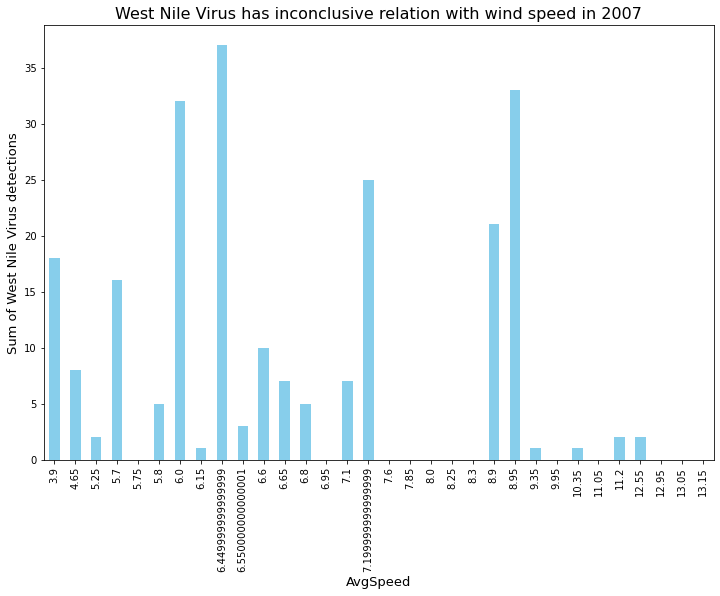

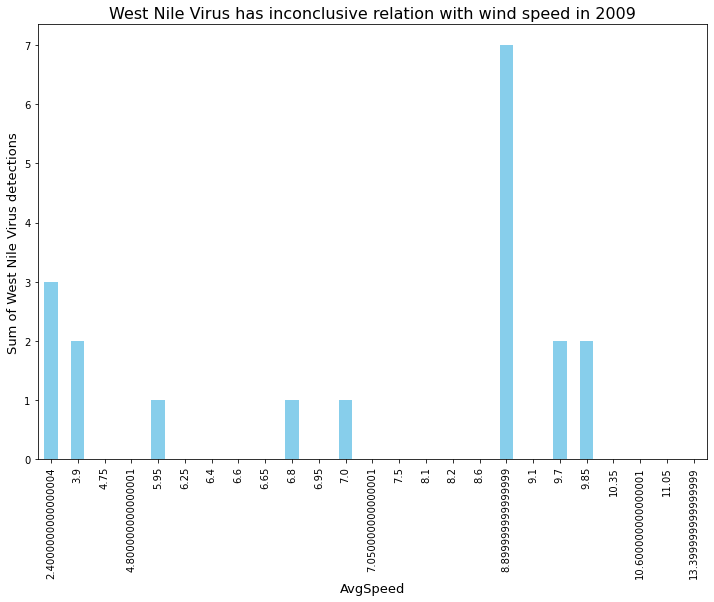

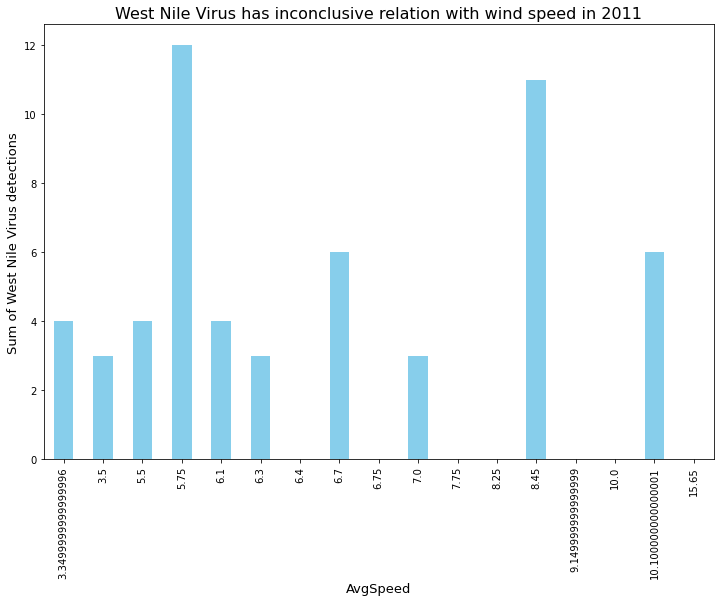

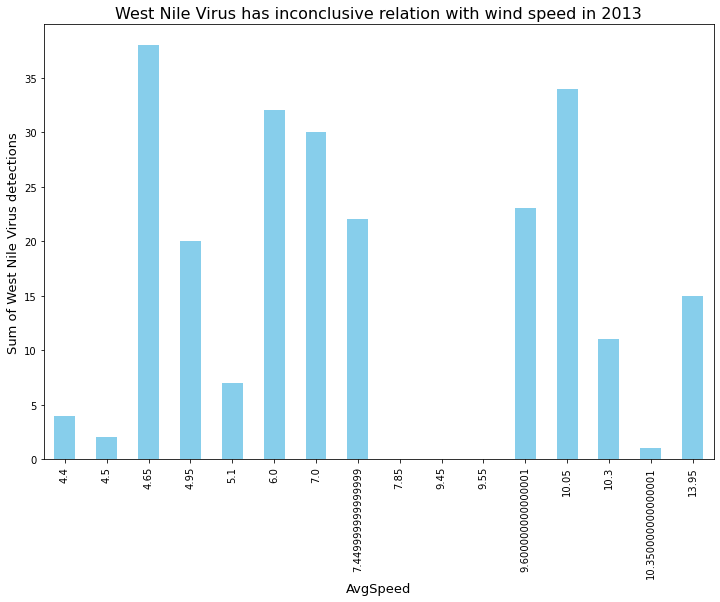

In [67]:
for x in train_weather_df['Year'].unique():
    plt.figure(figsize=(12,8))
    train_weather_df[train_weather_df['Year']==x].groupby(['AvgSpeed'])['WnvPresent'].sum().plot.bar(color='skyblue') 
    plt.title(f"West Nile Virus has inconclusive relation with wind speed in {x}", fontsize=16)
    plt.xlabel("AvgSpeed", fontsize =13)
    plt.xticks(rotation=90)
    plt.ylabel("Sum of West Nile Virus detections", fontsize=13)

Lastly, windspeed seems to have inconclusive relationship with WNV detection.

## Spray Dataset

### Treatment of Spray Dataset

In [68]:
spray_df.head()

,Date,Time,Latitude,Longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163
2,2011-08-29,6:57:18 PM,42.391022,-88.089157
3,2011-08-29,6:57:28 PM,42.390637,-88.089158
4,2011-08-29,6:57:38 PM,42.390410,-88.088858


In [69]:
spray_df['Date']=pd.to_datetime(spray_df['Date']) 

In [70]:
# Add new columns for day, month and year - weekday
# day
spray_df['Day'] = spray_df['Date'].dt.day
# month
spray_df['Month'] = spray_df['Date'].dt.month
# year
spray_df['Year'] = spray_df['Date'].dt.year

In [71]:
spray_df.describe()

,Latitude,Longitude,Day,Month,Year
count,14835.000000,14835.000000,14835.000000,14835.000000,14835.000000
mean,41.904828,-87.736690,17.073812,7.948028,2012.702191
std,0.104381,0.067292,7.959018,0.677402,0.712013
min,41.713925,-88.096468,5.000000,7.000000,2011.000000
25%,41.785001,-87.794225,8.000000,7.000000,2013.000000
50%,41.940075,-87.727853,17.000000,8.000000,2013.000000
75%,41.980978,-87.694108,25.000000,8.000000,2013.000000
max,42.395983,-87.586727,29.000000,9.000000,2013.000000


Seen from the minimum values and maximum values for month, sprays data is provided between July to September. 

Similarly from the minimum and maximum values for years, we observe that data is provided between the years 2011 to 2013.

In [72]:
# Check for null values
spray_df.isnull().sum() 

Date           0
Time         584
Latitude       0
Longitude      0
Day            0
Month          0
Year           0
dtype: int64

We observed that there are a total of 584 null values, which is around 4% of total spray data. We will observe below if there are ways we may be able to deductively impute the missing data.

In [73]:
# Check if there are patterns for time
spray_df['Time'].value_counts()

7:44:32 PM    541
8:57:46 PM      5
9:31:27 PM      5
9:35:47 PM      5
9:37:27 PM      5
             ... 
9:39:58 PM      1
9:39:48 PM      1
9:39:38 PM      1
9:39:28 PM      1
8:04:21 PM      1
Name: Time, Length: 8583, dtype: int64

Based on the value counts above, we observe that the most observations of sprays happened at 7:44:32PM.

Even though a large number of 541 observations happened at that timing,  it smaller than the 584 observations with missing values, making the deductive imputation a weak one. As such, we decide to drop time as a feature as we are unable to have a strong deductive imputation.

In [74]:
spray_df[spray_df['Time'].isnull()]

,Date,Time,Latitude,Longitude,Day,Month,Year
1030,2011-09-07,NaN,41.987092,-87.794286,7,9,2011
1031,2011-09-07,NaN,41.987620,-87.794382,7,9,2011
1032,2011-09-07,NaN,41.988004,-87.794574,7,9,2011
1033,2011-09-07,NaN,41.988292,-87.795486,7,9,2011
1034,2011-09-07,NaN,41.988100,-87.796014,7,9,2011
...,...,...,...,...,...,...,...
1609,2011-09-07,NaN,41.995876,-87.811615,7,9,2011
1610,2011-09-07,NaN,41.995972,-87.810271,7,9,2011
1611,2011-09-07,NaN,41.995684,-87.810319,7,9,2011
1612,2011-09-07,NaN,41.994724,-87.810415,7,9,2011


#### Splitting spray data into 2 years, 2011 and 2013

In [75]:
# To remove outliers spotted above latitude 42.3 
spray_2011 = spray_df[(spray_df['Year']==2011) & (spray_df['Latitude']<42.3)]

In [76]:
spray_2011

,Date,Time,Latitude,Longitude,Day,Month,Year
95,2011-09-07,7:52:52 PM,41.981433,-87.787777,7,9,2011
96,2011-09-07,7:53:02 PM,41.980998,-87.787778,7,9,2011
97,2011-09-07,7:53:12 PM,41.980560,-87.787762,7,9,2011
98,2011-09-07,7:53:22 PM,41.980198,-87.787758,7,9,2011
99,2011-09-07,7:53:32 PM,41.979752,-87.787765,7,9,2011
...,...,...,...,...,...,...,...
2204,2011-09-07,9:40:30 PM,41.990155,-87.817828,7,9,2011
2205,2011-09-07,9:40:40 PM,41.989638,-87.817857,7,9,2011
2206,2011-09-07,9:40:50 PM,41.989088,-87.817867,7,9,2011
2207,2011-09-07,9:41:00 PM,41.988812,-87.817618,7,9,2011


In [77]:
spray_2011.describe() 

,Latitude,Longitude,Day,Month,Year
count,2114.000000,2114.000000,2114.0,2114.0,2114.0
mean,41.983344,-87.805927,7.0,9.0,2011.0
std,0.006702,0.012738,0.0,0.0,0.0
min,41.968435,-87.836560,7.0,9.0,2011.0
25%,41.977943,-87.816806,7.0,9.0,2011.0
50%,41.985556,-87.803253,7.0,9.0,2011.0
75%,41.986460,-87.794225,7.0,9.0,2011.0
max,41.997028,-87.787710,7.0,9.0,2011.0


In [78]:
# Check that outlier has been removed 
spray_2011[spray_2011["Latitude"]>42.3]

,Date,Time,Latitude,Longitude,Day,Month,Year


In several iterations of exploration of data, we noted that there was a location outlier in spray. As the spray was a large distance away from the mosquito traps and away from the area of concern, we decided to remove them.

In [79]:
spray_2013 = spray_df[spray_df['Year']==2013] 

In [80]:
spray_2013   

,Date,Time,Latitude,Longitude,Day,Month,Year
2209,2013-07-17,7:45:45 PM,41.997728,-87.767532,17,7,2013
2210,2013-07-17,7:45:55 PM,41.997990,-87.768085,17,7,2013
2211,2013-07-17,7:46:05 PM,41.998237,-87.768623,17,7,2013
2212,2013-07-17,7:46:15 PM,41.998510,-87.769225,17,7,2013
2213,2013-07-17,7:46:25 PM,41.998793,-87.769833,17,7,2013
...,...,...,...,...,...,...,...
14830,2013-09-05,8:34:11 PM,42.006587,-87.812355,5,9,2013
14831,2013-09-05,8:35:01 PM,42.006192,-87.816015,5,9,2013
14832,2013-09-05,8:35:21 PM,42.006022,-87.817392,5,9,2013
14833,2013-09-05,8:35:31 PM,42.005453,-87.817423,5,9,2013


In [81]:
spray_2013.describe()  

,Latitude,Longitude,Day,Month,Year
count,12626.000000,12626.000000,12626.000000,12626.000000,12626.0
mean,41.888014,-87.722413,18.670759,7.771503,2013.0
std,0.098442,0.057701,7.335957,0.568046,0.0
min,41.713925,-87.871023,5.000000,7.000000,2013.0
25%,41.776598,-87.772391,15.000000,7.000000,2013.0
50%,41.927467,-87.718459,17.000000,8.000000,2013.0
75%,41.958267,-87.685244,25.000000,8.000000,2013.0
max,42.018907,-87.586727,29.000000,9.000000,2013.0


### Exploring Spray Dataset

#### Explore if Spraying is a Lagging or Leading indicator of WNV outbreaks

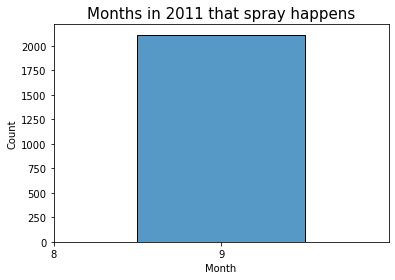

In [82]:
plt.xlim([8, 10])
plt.xticks(np.arange(8, 10))
sns.histplot(spray_2011, x='Month', discrete=True)
plt.title('Months in 2011 that spray happens', fontsize=15);

Noted that sprays for 2011 all happen in just 1 month alone in 2011.

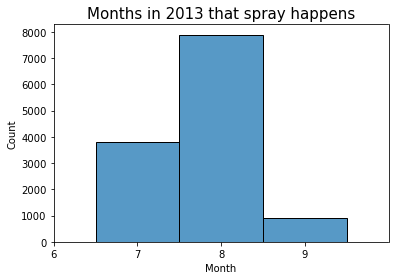

In [83]:
plt.xlim([6,10])
plt.xticks(np.arange(6, 10))
sns.histplot(spray_2013, x='Month', discrete=True)
plt.title('Months in 2013 that spray happens', fontsize=15);

Noted that sprays for 2013 all happen in across 3 months in 2013. Also noted that the bulk of spraying efforts was in the month of August. The spraying efforts in 2013 are also significantly higher compared to 2011. In 2011, it was around 2000 sprays in September, but in 2013, the number of spray in July was already double it at 4,000, and then 8,000 in August, before tapering down in September at 1,000.

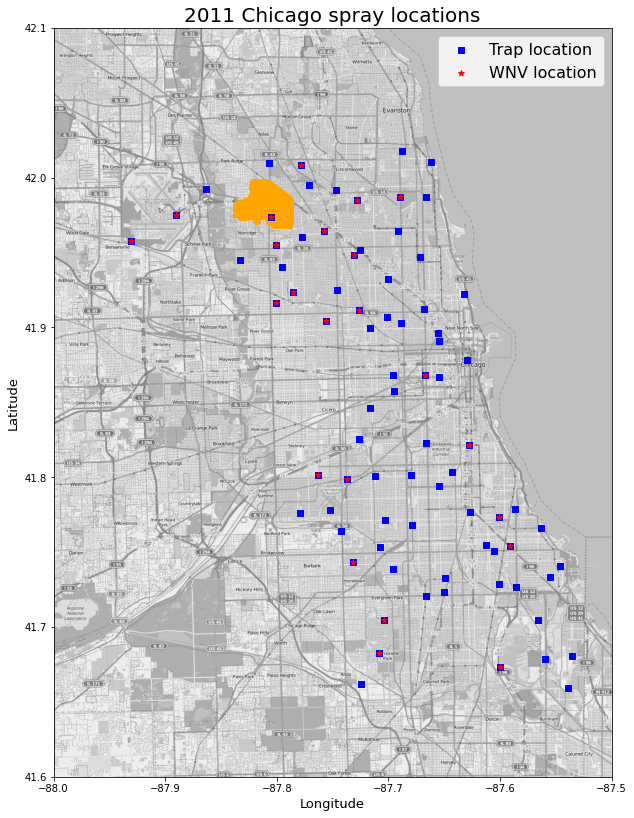

In [84]:
# Import map data
mapdata = np.loadtxt("../datasets/mapdata_copyright_openstreetmap_contributors.txt")

# After outlier removed
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)


# Plot spray locations
spray_locations_2011 = spray_2011[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(spray_locations_2011[:,0], spray_locations_2011[:,1], marker='o', color='Orange')

# Plot trap locations
trap_locations_2011 = train_2011[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(trap_locations_2011[:,0], trap_locations_2011[:,1], marker='s', color='Blue', label='Trap location');

# PLot WNV locations
wnv_locations_2011 = train_2011_wnv[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(wnv_locations_2011[:,0], wnv_locations_2011[:,1], marker='*', color='Red', label='WNV location');

plt.title('2011 Chicago spray locations', fontsize=20)
plt.xlabel('Longitude', fontsize=13)
plt.ylabel('Latitude', fontsize=13)
plt.legend(fontsize=16);

Spraying in 2011 was very concentrated in specific region in the north of Chicago.

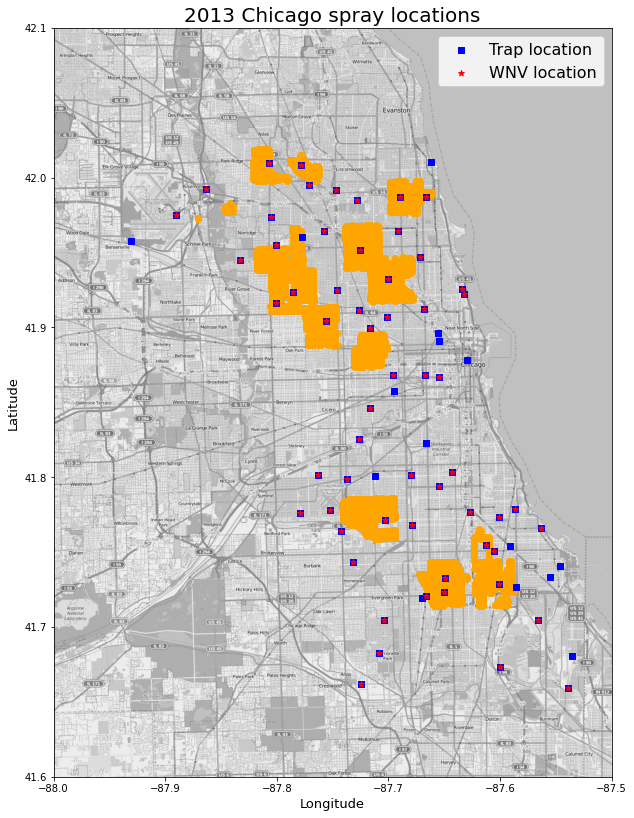

In [85]:
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1) 

plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)

# Plot spray locations
spray_locations_2013 = spray_2013[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(spray_locations_2013[:,0], spray_locations_2013[:,1], marker='o', color='Orange');

# Plot trap locations
trap_locations_2013 = train_2013[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(trap_locations_2013[:,0], trap_locations_2013[:,1], marker='s', color='Blue', label='Trap location');

# PLot WNV locations
wnv_locations_2013 = train_2013_wnv[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(wnv_locations_2013[:,0], wnv_locations_2013[:,1], marker='*', color='Red', label='WNV location')

plt.title('2013 Chicago spray locations', fontsize=20)
plt.xlabel('Longitude', fontsize=13)
plt.ylabel('Latitude', fontsize=13)
plt.legend(fontsize=16);

Similar location and broadened in 2013, for sprays. However WNV also seems to have spreaded. There is also a lack of overlap for spray regions over all WNV outbreak regions. This might be a sign of indiscriminate spraying practice. We will look at spray concentration across 2011 and 2013 to see if it gives us any further insights. 

#### Spray concentration in 2011 and 2013

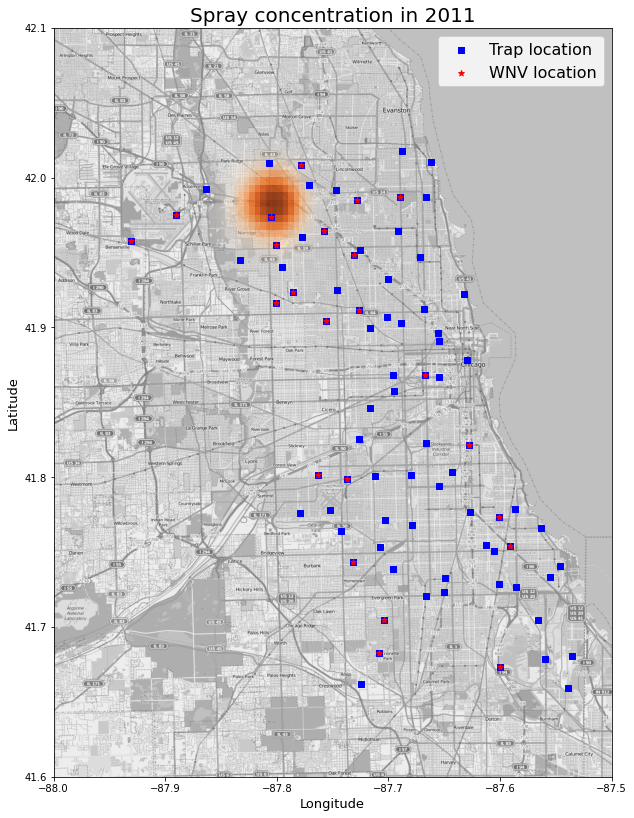

In [86]:
# To investigate location density of West Nile Virus
alpha_cm = plt.cm.Oranges
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

#Location of sprays

X = spray_2011[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.015)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))

#kernel density
plt.figure(figsize=(10,14))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=lon_lat_box, aspect=aspect)
plt.imshow(zv, origin='lower', cmap=alpha_cm, extent=lon_lat_box, aspect=aspect)

#Trap locations
trap_locations_2011 = train_2011[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(trap_locations_2011[:,0], trap_locations_2011[:,1], marker='s', color='Blue', label='Trap location');

# PLot WNV locations
wnv_locations_2011 = train_2011_wnv[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(wnv_locations_2011[:,0], wnv_locations_2011[:,1], marker='*', color='Red', label='WNV location');


plt.title('Spray concentration in 2011', fontsize=20)
plt.xlabel('Longitude', fontsize=13)
plt.ylabel('Latitude', fontsize=13)
plt.legend(fontsize=16);

Spray was heavily concentrated in 1 area in 2011.

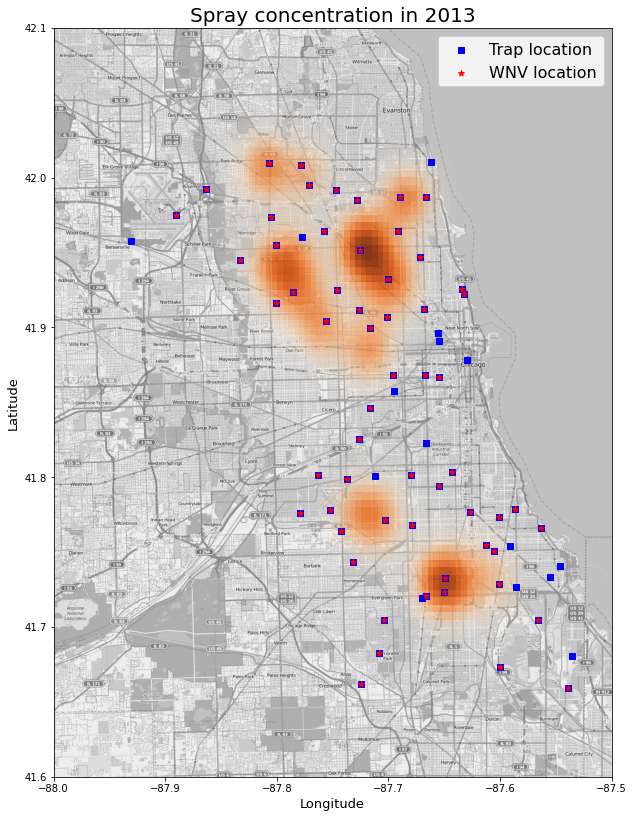

In [87]:
# To investigate location density of West Nile Virus
alpha_cm = plt.cm.Oranges
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

#Location of sprays

X = spray_2013[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.015)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))

#kernel density
plt.figure(figsize=(10,14))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=lon_lat_box, aspect=aspect)
plt.imshow(zv, origin='lower', cmap=alpha_cm, extent=lon_lat_box, aspect=aspect)

#Trap locations
trap_locations_2013 = train_2013[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(trap_locations_2013[:,0], trap_locations_2013[:,1], marker='s', color='Blue', label='Trap location');

# PLot WNV locations
wnv_locations_2013 = train_2013_wnv[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(wnv_locations_2013[:,0], wnv_locations_2013[:,1], marker='*', color='Red', label='WNV location')

plt.title('Spray concentration in 2013', fontsize=20)
plt.xlabel('Longitude', fontsize=13)
plt.ylabel('Latitude', fontsize=13)
plt.legend(fontsize=16);

We noted that there are two darkest area where spray is concentrated in 2013.

#### Density of WNV occurences in 2011 and 2013

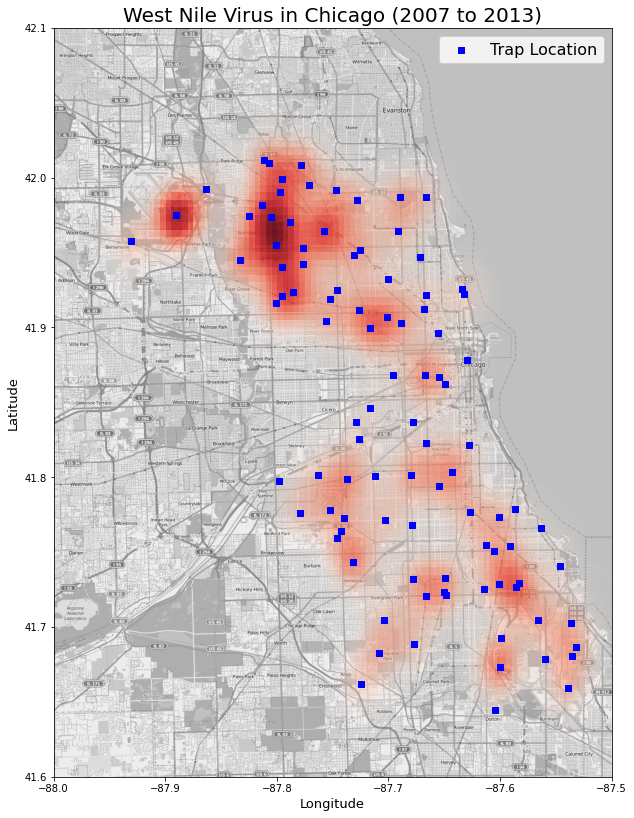

In [88]:
# To investigate location density of West Nile Virus
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

#Traps where only WNV is present
sightings = train_df[train_df['WnvPresent'] == 1]
sightings = sightings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sightings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.015)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))

#kernel density
plt.figure(figsize=(10,14))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=lon_lat_box, aspect=aspect)
plt.imshow(zv, origin='lower', cmap=alpha_cm, extent=lon_lat_box, aspect=aspect)

#Trap locations
locations = sightings[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='s', color='Blue', label='Trap Location')


plt.title('West Nile Virus in Chicago (2007 to 2013)', fontsize=20)
plt.xlabel('Longitude', fontsize=13)
plt.ylabel('Latitude', fontsize=13)
plt.legend(fontsize=16);

Comparing the spray charts with the WNV density chart above, we can see that the sprays are targeted in the densest parts where the West Nile virus outbreaks have happened over the years.

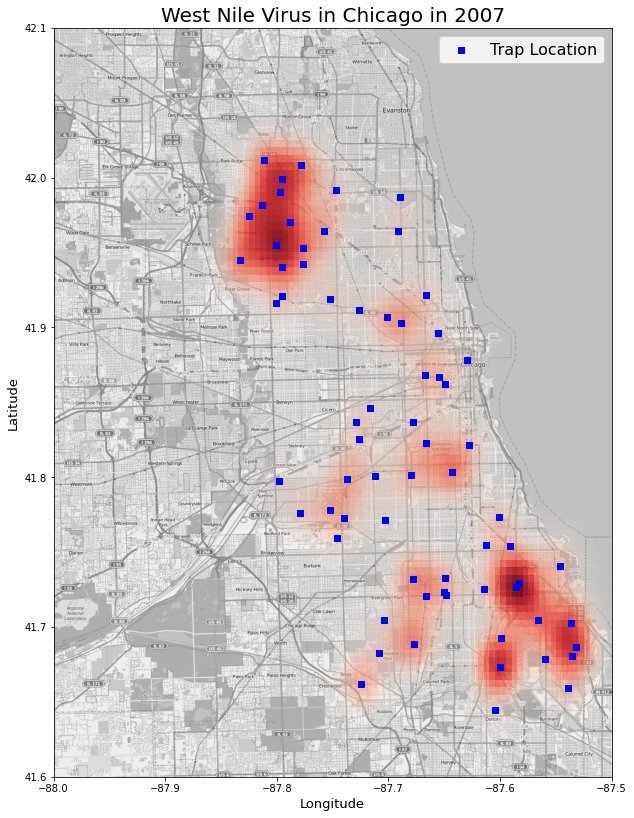

In [89]:
# To investigate 2007 visually has lower density in the hotspot areas after spraying

# To investigate location density of West Nile Virus
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

#Traps where only WNV is present
sightings = train_df[(train_df['WnvPresent'] == 1) & (train_df['Year'] == 2007)]
sightings = sightings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sightings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.015)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))

#kernel density
plt.figure(figsize=(10,14))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=lon_lat_box, aspect=aspect)
plt.imshow(zv, origin='lower', cmap=alpha_cm, extent=lon_lat_box, aspect=aspect)

#Trap locations
locations = sightings[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='s', color='Blue', label='Trap Location')


plt.title('West Nile Virus in Chicago in 2007', fontsize=20)
plt.xlabel('Longitude', fontsize=13)
plt.ylabel('Latitude', fontsize=13)
plt.legend(fontsize=16);

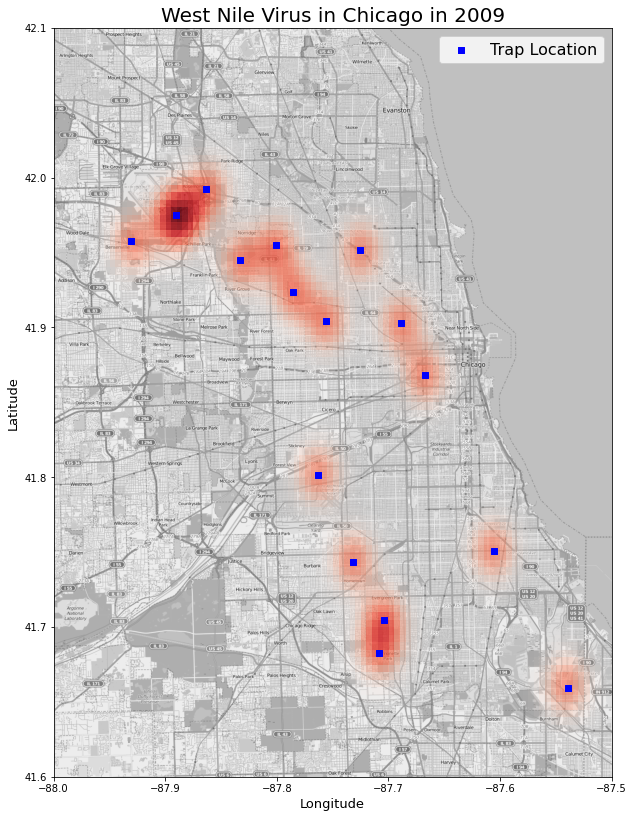

In [90]:
# To investigate 2009 visually has lower density in the hotspot areas after spraying

# To investigate location density of West Nile Virus
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

#Traps where only WNV is present
sightings = train_df[(train_df['WnvPresent'] == 1) & (train_df['Year'] == 2009)]
sightings = sightings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sightings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.015)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))

#kernel density
plt.figure(figsize=(10,14))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=lon_lat_box, aspect=aspect)
plt.imshow(zv, origin='lower', cmap=alpha_cm, extent=lon_lat_box, aspect=aspect)

#Trap locations
locations = sightings[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='s', color='Blue', label='Trap Location')


plt.title('West Nile Virus in Chicago in 2009', fontsize=20)
plt.xlabel('Longitude', fontsize=13)
plt.ylabel('Latitude', fontsize=13)
plt.legend(fontsize=16);

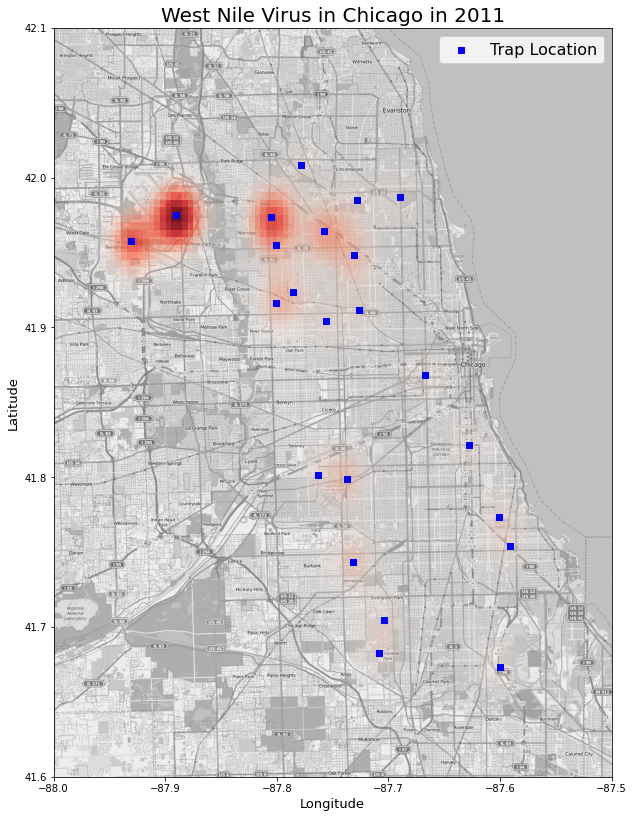

In [91]:
# To investigate 2011 has lower density in the hotspot areas after spraying

# To investigate location density of West Nile Virus
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

#Traps where only WNV is present
sightings = train_df[(train_df['WnvPresent'] == 1) & (train_df['Year'] == 2011)]
sightings = sightings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sightings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.015)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))

#kernel density
plt.figure(figsize=(10,14))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=lon_lat_box, aspect=aspect)
plt.imshow(zv, origin='lower', cmap=alpha_cm, extent=lon_lat_box, aspect=aspect)

#Trap locations
locations = sightings[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='s', color='Blue', label='Trap Location')


plt.title('West Nile Virus in Chicago in 2011', fontsize=20)
plt.xlabel('Longitude', fontsize=13)
plt.ylabel('Latitude', fontsize=13)
plt.legend(fontsize=16);

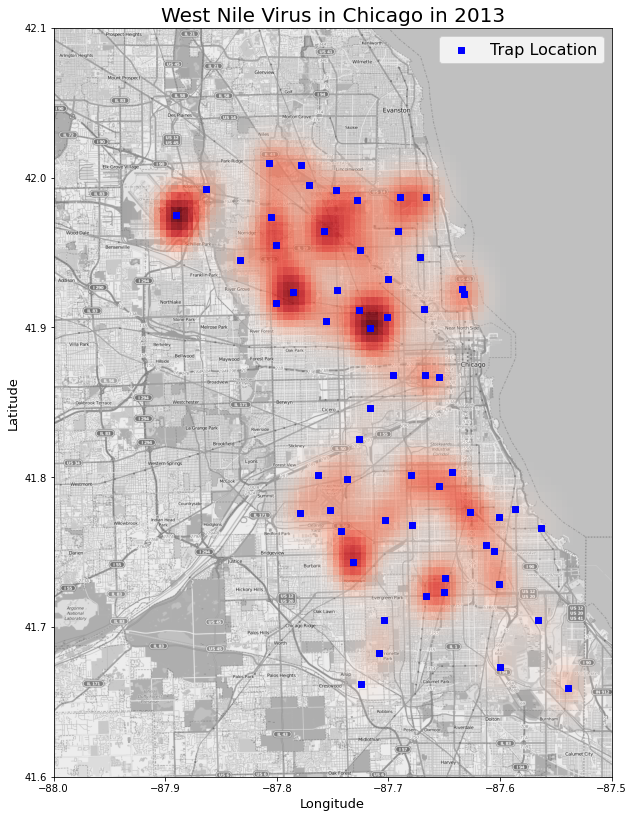

In [92]:
# To investigate if 2013 has lower density in the hotspot areas after spraying

# To investigate location density of West Nile Virus
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

#Traps where only WNV is present
sightings = train_df[(train_df['WnvPresent'] == 1) & (train_df['Year'] == 2013)]
sightings = sightings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sightings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.015)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))

#kernel density
plt.figure(figsize=(10,14))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=lon_lat_box, aspect=aspect)
plt.imshow(zv, origin='lower', cmap=alpha_cm, extent=lon_lat_box, aspect=aspect)

#Trap locations
locations = sightings[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='s', color='Blue', label='Trap Location')


plt.title('West Nile Virus in Chicago in 2013', fontsize=20)
plt.xlabel('Longitude', fontsize=13)
plt.ylabel('Latitude', fontsize=13)
plt.legend(fontsize=16);

Across the years, we see that there are several hotspots where WNV is present. There seems to be a reason why 2011 did not spray in the southern region compared to 2013, as WNV was relatively tame that year.

#### Spray Data Evaluation

From the graphs, it seems like sprays are a lagging indicator of WNV. Sprays might even have been used as an emergency vector control.

Furthermore, test data only has years 2008, 2010, 2012 and 2014 data, whereas spray dataset has years 2011 and 2013. In the absence of a spray column on test data, spray dataset cannot be used to predict the occurence of WNV.

We will instead use spray dataset to do the cost benefit analysis.

#### Investigate Efficacy of Spray

In [93]:
# Create dataframe for 2011 and 2013 train dataset
train_2011 = train_df[train_df['Year']==2011]
train_2013 = train_df[train_df['Year']==2013]

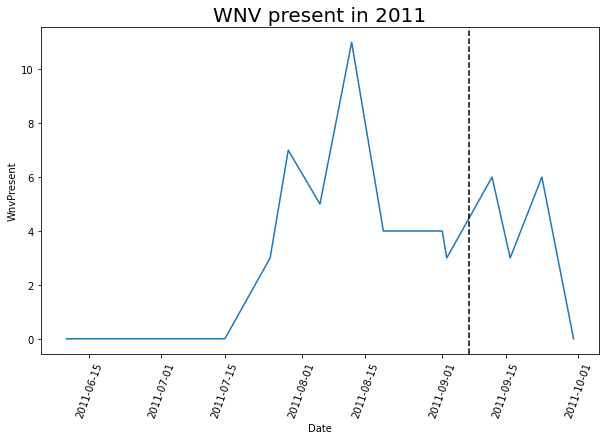

In [94]:
plt.figure(figsize=(10, 6))
# Plot number of WNV present in traps against date

sns.lineplot(data=train_2011.groupby('Date')['WnvPresent'].sum())
plt.axvline(
    spray_2011['Date'].drop_duplicates(), # Spray dates in 2011, for plotting on graph
    color='black',
    linestyle='--'
           )    
plt.xticks(rotation=70)
plt.title('WNV present in 2011', fontsize=20);

For 2011, WNV present does not seem to decline after sprays. It was noted that until a period of more than 2 weeks, then we see a decline. This might be because spraying kills the adult mosquitos, but larvaes that hatch are still around to transmit the virus once they reach adulthood.

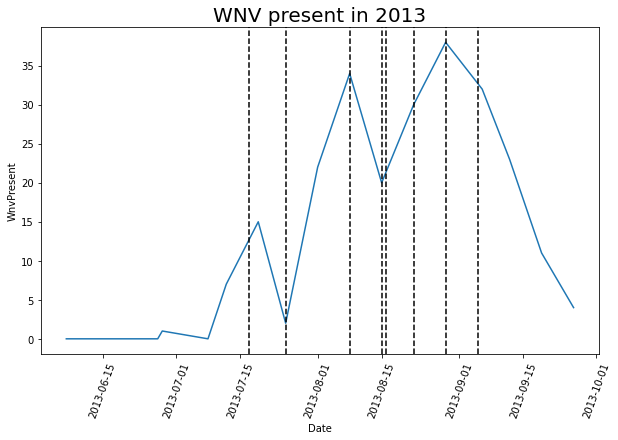

In [95]:
plt.figure(figsize=(10, 6))
# Plot number of WNV present in traps against date

sns.lineplot(data=train_2013.groupby('Date')['WnvPresent'].sum())

# For loop to plot all spray dates
for _ in spray_2013['Date'].drop_duplicates():    # Spray dates in 2013, for plotting on graph
    plt.axvline(_,color='black',linestyle='--') 
plt.xticks(rotation=70)
plt.title('WNV present in 2013', fontsize=20);

For 2013, there are instances where WNV present seem to decline after sprays, but subsequently spiked back up again. In 2013, it seems like the number of WNV present was so out of control that authorities had to keep spraying in tigher and tighter intervals.

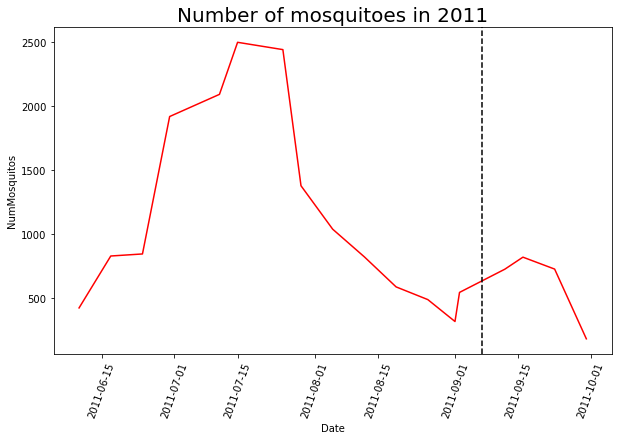

In [96]:
plt.figure(figsize=(10, 6))
# Plot number of Mosquitos present in traps against date

sns.lineplot(data=train_2011.groupby('Date')['NumMosquitos'].sum(), color='r')
plt.axvline(
    spray_2011['Date'].drop_duplicates(), # Spray dates in 2011, for plotting on graph
    color='black',
    linestyle='--'
           )    
plt.xticks(rotation=70)
plt.title('Number of mosquitoes in 2011', fontsize=20);

Surprisingly, the number of mosquitos collected after spraying did not seem to decline much in 2011. 

This might be because sprays were focused in one particular area where the occurences of WNV was the highest.

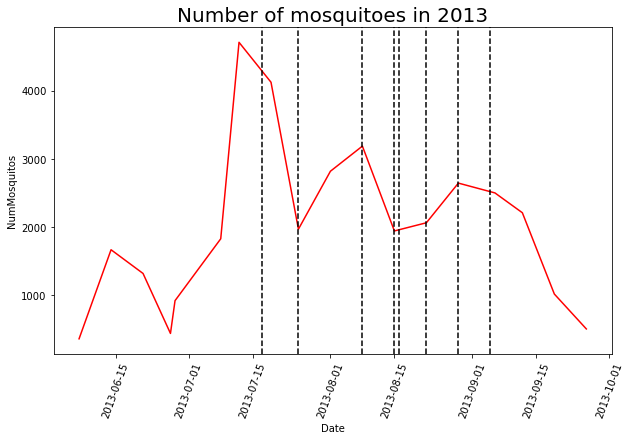

In [97]:
plt.figure(figsize=(10, 6))
# Plot number of Mosquitos present in traps against date

sns.lineplot(data=train_2013.groupby('Date')['NumMosquitos'].sum(), color='r')

# For loop to plot all spray dates
for _ in spray_2013['Date'].drop_duplicates():    # Spray dates in 2013, for plotting on graph
    plt.axvline(_,color='black',linestyle='--')    
    
plt.xticks(rotation=70)
plt.title('Number of mosquitoes in 2013', fontsize=20);

On the other hand, we see better declines in mosquito numbers after spraying in 2013. This is due to more extensive spraying efforts where the spraying overlaps with many of the trap locations. Comparing WNV present and number of mosquitoes in 2013, it brings doubt on whether authorities are properly targeting the WNV prone regions properly, or just randomly spraying as WNV was going out of control.

# Exports

Exporting the datasets cleaned from this notebook. These datasets will be used for Feature Engineering.

In [98]:
train_df.to_csv('../datasets/train_df.csv', index = False)
test_df.to_csv('../datasets/test_df.csv', index = False)
weather_df.to_csv('../datasets/weather_df.csv', index=False)
train_weather_df.to_csv('../datasets/train_weather.csv', index=False)